In [48]:
%env WEBBPSF_PATH /Users/will/Work/webbpsf-data

env: WEBBPSF_PATH=/Users/will/Work/webbpsf-data


In [1141]:
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
import astropy.units as u
from astropy.modeling import models, fitting
from astropy.nddata import Cutout2D
from astropy.convolution import (
    interpolate_replace_nans, 
    Box2DKernel, 
    Gaussian2DKernel, 
    convolve
)
from astropy.stats import sigma_clip
from regions import PixCoord, CirclePixelRegion, Regions
from reproject import reproject_interp
import webbpsf
from scipy import ndimage as ndi
import skimage as ski
from pathlib import Path
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
import astropy.visualization as av

In [763]:
matplotlib.rcParams['image.origin'] = 'lower'
matplotlib.rcParams['image.interpolation'] = "nearest"

## Load the JWST NIRCAM image

In [3]:
datapath = Path.cwd().parent / "data"
hdulist = fits.open(datapath / "wr124-jwst-nircam-2022-f090w.fits")
hdulist.info()

Filename: /Users/will/Dropbox/globule-seminario/m1-67/data/wr124-jwst-nircam-2022-f090w.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     374   ()      
  1  SCI           1 ImageHDU        75   (4672, 4666)   float32   
  2  ERR           1 ImageHDU        10   (4672, 4666)   float32   
  3  CON           1 ImageHDU        10   (4672, 4666, 1)   int32   
  4  WHT           1 ImageHDU         9   (4672, 4666)   float32   
  5  VAR_POISSON    1 ImageHDU         9   (4672, 4666)   float32   
  6  VAR_RNOISE    1 ImageHDU         9   (4672, 4666)   float32   
  7  VAR_FLAT      1 ImageHDU         9   (4672, 4666)   float32   
  8  HDRTAB        1 BinTableHDU    824   32R x 407C   [23A, 5A, 3A, 45A, 7A, 13A, 7A, 6A, 7A, 10A, 4A, L, D, D, D, D, 32A, 50A, 32A, 21A, 3A, 3A, D, D, 10A, 12A, 23A, 23A, 26A, 11A, 5A, 3A, 3A, 2A, 1A, 2A, 1A, L, 14A, 20A, 2A, 26A, 20A, 27A, 10A, K, L, L, L, L, 9A, 9A, 5A, D, D, D, D, D, D, 27A, D, D, D, 6A, 5A, 1

## Find the peaks in the image

We can set a brightness threshold and a minimum distance between peaks

In [23]:
peaks = ski.feature.peak_local_max(hdulist["SCI"].data, min_distance=6, threshold_abs=4.0)

If we bring the threshold down to 4 and the minimum distance to 6, then we get nearly all the stars, but we also start to pick up on some false positives. 

In [24]:
len(peaks)

5160

So this finds over 5000 peaks, the majority of which are real stars

In [25]:
peaks[:10]

array([[2322, 2327],
       [2314, 2322],
       [2313, 2309],
       [2328, 2306],
       [3446,  997],
       [ 484, 3589],
       [4256, 2786],
       [2885, 2859],
       [ 835, 1885],
       [2207, 4365]])

Write the peaks out as a regions file for DS9

In [26]:
regs = Regions([CirclePixelRegion(center=PixCoord(x ,y), radius=3)
                for y, x in peaks])
regname = "star-peaks.reg"
regs.write(datapath / regname, format="ds9", overwrite=True)

### Start with the brightest stars

In [683]:
bright_peaks = ski.feature.peak_local_max(
    hdulist["SCI"].data, 
    min_distance=20, 
    threshold_abs=1000.0,
)

In [684]:
len(bright_peaks)

123

In [685]:
regs = Regions([CirclePixelRegion(center=PixCoord(x ,y), radius=15)
                for y, x in bright_peaks])
regname = "star-bright-peaks-1000.reg"
regs.write(datapath / regname, format="ds9", overwrite=True)

This gets a smaller number of brighter stars. It does miss some of the bright saturatedones though, since they do not quite make the criterion. 

So the plan is to fit the psf for all these and remove them, and then to do find_peaks again to get the fainter ones. 

Demonstration that the peaks are in order of brightness:

In [686]:
print("Brightest peaks:")
for (j, i) in bright_peaks[:5]:
    print(f"({j}, {i}) = {hdulist['SCI'].data[j, i]:.2f}")

Brightest peaks:
(2322, 2327) = 5483.39
(3446, 997) = 4613.60
(484, 3589) = 4414.06
(4256, 2786) = 4356.36
(2885, 2859) = 4002.11


In [687]:
print("Faintest peaks:")
for (j, i) in peaks[-5:]:
    print(f"({j}, {i}) = {hdulist['SCI'].data[j, i]:.2f}")

Faintest peaks:
(3712, 4108) = 4.01
(697, 142) = 4.01
(764, 2747) = 4.00
(2894, 743) = 4.00
(3838, 847) = 4.00


## Demo of PSF removal

Following the [webbpsf tutorial notebook](https://nbviewer.org/github/spacetelescope/webbpsf/blob/stable/notebooks/WebbPSF_tutorial.ipynb) and the [User Guide](https://webbpsf.readthedocs.io/en/latest/)

In [50]:
nc = webbpsf.NIRCam()
nc.filter = "F090W"
nc.options

{'jitter': 'gaussian',
 'jitter_sigma': 0.0008,
 'pupil_shift_x': 0,
 'pupil_shift_y': 0}

In [57]:
nc.detector_position?

Type:        property
String form: <property object at 0x167ec5590>
Docstring:  
The pixel position in (X, Y) on the detector, relative to the currently-selected SIAF aperture subarray.
By default the SIAF aperture will correspond to the full-frame detector, so (X,Y) will in that case be
absolute (X,Y) pixels on the detector. But if you select a subarray aperture name from the SIAF, then
the (X,Y) are interpreted as (X,Y) within that subarray.

Please note, this is X,Y order - **not** a Pythonic y,x axes ordering.

Start off with a moderate sized box of 512x512 pixels

In [242]:
psf = nc.calc_psf(fov_pixels=512)

First HDU (0: OVERSAMP) is oversampled by 4. Second HDU (1: DET_SAMP) is with the native NIRCAM pixels

In [243]:
psf.info()

Filename: (No file associated with this HDUList)
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  OVERSAMP      1 PrimaryHDU     140   (2048, 2048)   float64   
  1  DET_SAMP      1 ImageHDU       142   (512, 512)   float64   
  2  OVERDIST      1 ImageHDU       189   (2048, 2048)   float64   
  3  DET_DIST      1 ImageHDU       195   (512, 512)   float64   


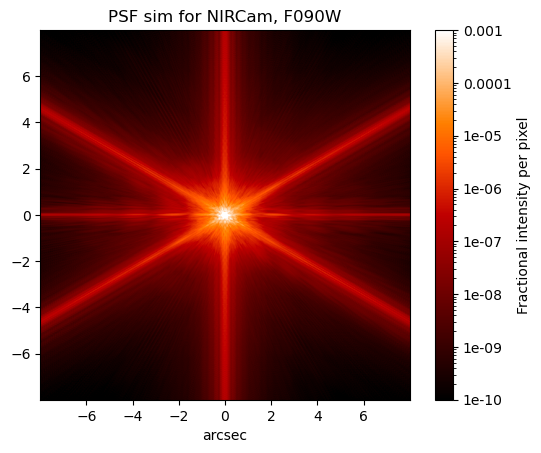

In [244]:
webbpsf.display_psf(psf, ext=1, vmax=0.001, vmin=1e-10)

Now extract the same-sized window from the observations. 

I have measured the star position in the dithered image.

In [245]:
xy_star_fits = 2316.35, 2323.38

In [246]:
i0, j0 = np.round(xy_star_fits).astype(int)
imslice = slice(j0 - 256, j0 + 256), slice(i0 - 256, i0 + 256)
imslice

(slice(2067, 2579, None), slice(2060, 2572, None))

We are going to have to rotate and shift the sub-sampled PSF, which we can do using fake WCS with reproject. Hopefully that is fast enough

In [247]:
imobs = hdulist["SCI"].data[imslice] - 0.2
weights = hdulist["WHT"].data[imslice]
imobs[weights == 0.0] = np.nan

The `-0.2` is for the background level. 

In [248]:
imobs.shape

(512, 512)

In [316]:
impsf = psf["DET_SAMP"].data
#impsf = psf["DET_DIST"].data

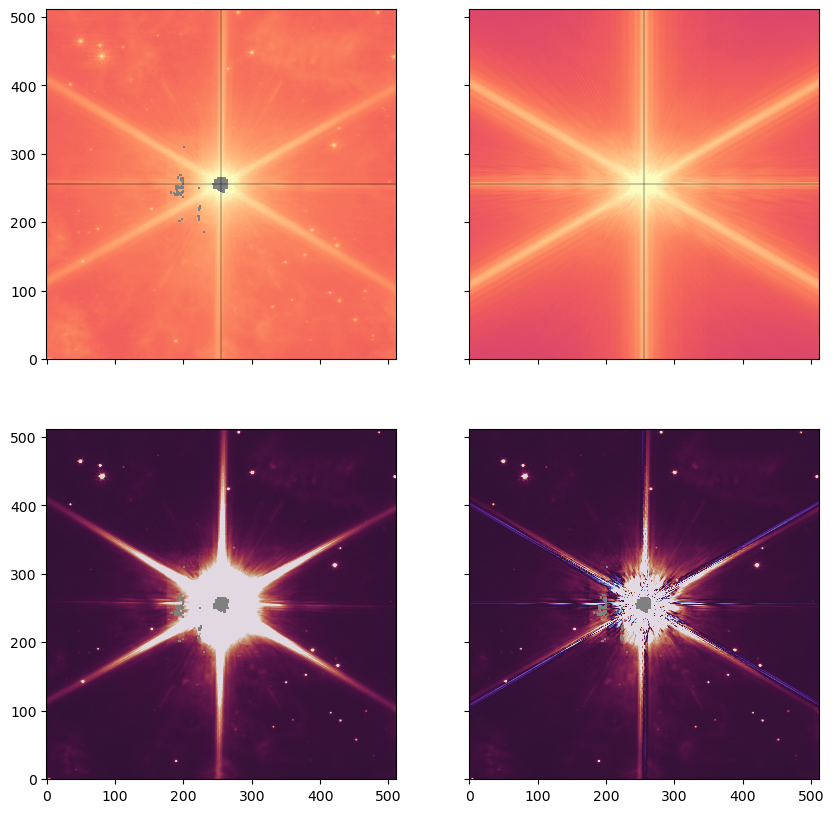

In [314]:
fig, ax = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10, 10))
norm = matplotlib.colors.LogNorm(vmin=0.0, vmax=1000.0)
scale_obs, scale_psf = 1.0, 3.5e-8
cmap = matplotlib.cm.get_cmap("magma").copy()
cmap.set_bad("gray")
ax[0, 0].imshow(imobs / scale_obs, norm=norm, cmap=cmap)
ax[0, 1].imshow(impsf / scale_psf, norm=norm, cmap=cmap)
for _ax in ax[0, :]:
    _ax.axhline(255.5, color="k", linewidth=0.3)
    _ax.axvline(255.5, color="k", linewidth=0.3)
vscale = 20
cmap = matplotlib.cm.get_cmap("twilight").copy()
cmap.set_bad("gray")
ax[1, 0].imshow(
    (imobs / scale_obs), 
    vmin=-vscale, vmax=vscale, cmap=cmap)
ax[1, 1].imshow(
    (imobs / scale_obs) - (impsf / scale_psf), 
    vmin=-vscale, vmax=vscale, cmap=cmap)

...;

In [281]:
w = 5
cslice = slice(256-w, 256+w)

/var/folders/sv/41w0vxds13d20rvl07t_1x2w0000gn/T/ipykernel_93416/1263023028.py:2: RuntimeWarning: Mean of empty slice
  ax[0].plot(np.nanmean(imobs[:, cslice], axis=1) / scale_obs)
/var/folders/sv/41w0vxds13d20rvl07t_1x2w0000gn/T/ipykernel_93416/1263023028.py:5: RuntimeWarning: Mean of empty slice
  ax[1].plot(np.nanmean(imobs[cslice, :], axis=0) / scale_obs)


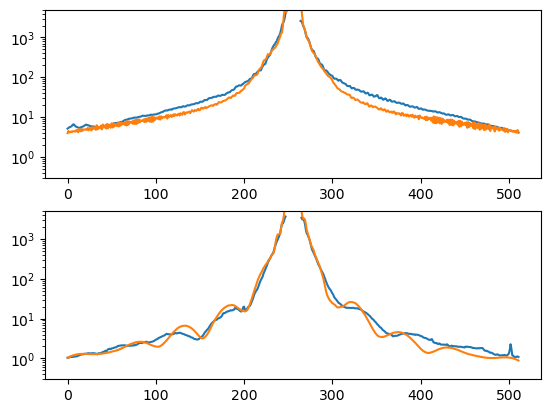

In [282]:
fig,  ax = plt.subplots(2, 1)
ax[0].plot(np.nanmean(imobs[:, cslice], axis=1) / scale_obs)
ax[0].plot(np.nanmean(impsf[:, cslice], axis=1) / scale_psf)
ax[0].set(yscale="log", ylim=[0.3, 5000.0])
ax[1].plot(np.nanmean(imobs[cslice, :], axis=0) / scale_obs)
ax[1].plot(np.nanmean(impsf[cslice, :], axis=0) / scale_psf)
ax[1].set(yscale="log", ylim=[0.3, 5000.0])
...;

### Setup fine and coarse WCS 

We will use coarse pixel units for both WCS. 
The fine grid is oversampled by a factor of 4, so we set the pixel size to be 0.25.
We put the origin in the center of the grid, which is at half-integer pixel value (pixel corner) since we have an even number of pixels.
Note that CRPIX is in FITS 1-based indexing.

In [219]:
finewcs = WCS(psf["OVERSAMP"])
finewcs.wcs.cdelt /= 4
finewcs.wcs.crpix = (np.array(finewcs.pixel_shape) + 1) / 2
finewcs.wcs.cunit = ["pixel", "pixel"]
finewcs.wcs.cname = ["x", "y"]
finewcs.wcs.ctype = ["pos.cartesian.x", "pos.cartesian.y"]
finewcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'pos.cartesian.x' 'pos.cartesian.x' 
CRVAL : 0.0 0.0 
CRPIX : 1024.5 1024.5 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 0.25 0.25 
NAXIS : 2048  2048

Same for the coarse grid, but with pixel size of 1.0

In [224]:
detwcs = WCS(psf["DET_SAMP"])
detwcs.wcs.crpix = (np.array(detwcs.pixel_shape) + 1) / 2
detwcs.wcs.cunit = ["pixel", "pixel"]
detwcs.wcs.cname = ["x", "y"]
detwcs.wcs.ctype = ["pos.cartesian.x", "pos.cartesian.y"]
detwcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'pos.cartesian.x' 'pos.cartesian.y' 
CRVAL : 0.0 0.0 
CRPIX : 256.5 256.5 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 1.0 1.0 
NAXIS : 512  512

Check that the corner pixels are symmetric with respect to the origin

In [225]:
detwcs.pixel_to_world([0, 511], [0, 511])

[<Quantity [-255.5,  255.5] pix>, <Quantity [-255.5,  255.5] pix>]

Check that the first four pixels on the fine grid have a mean position that is the same as the first pixel on the coarse grid

In [226]:
xx, yy = finewcs.pixel_to_world(range(4), range(4))
xx.mean(), yy.mean()

(<Quantity -255.5 pix>, <Quantity -255.5 pix>)

In [227]:
finewcs.world_axis_physical_types

[None, None]

### How to rotate the fine WCS

We use the PC matrix to rotate the axes by $\theta$. For an anticlockwise rotation we have
$$
\left( 
\begin{array}{cc}
 \cos\theta & -\sin\theta \\
 \sin\theta & \cos\theta
\end{array}
\right)
$$

In [234]:
theta = 1 * u.deg
cth, sth = np.cos(theta),  np.sin(theta)
finewcs.wcs.pc = [[cth, -sth], [sth, cth]]
finewcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'pos.cartesian.x' 'pos.cartesian.x' 
CRVAL : 0.0 0.0 
CRPIX : 1024.5 1024.5 
PC1_1 PC1_2  : 0.9998476951563913 -0.01745240643728351 
PC2_1 PC2_2  : 0.01745240643728351 0.9998476951563913 
CDELT : 0.25 0.25 
NAXIS : 2048  2048

Check that the bottom left corner moves in the way that I expect.

In [235]:
xx, yy = finewcs.pixel_to_world(range(4), range(4))
xx.mean(), yy.mean()

(<Quantity -251.00199627 pix>, <Quantity -259.92017596 pix>)

The translations can be acheived by changing either CRPPIX or CRVAL. I think that CRVAL makes more sense, since that is equivalent to moving the psf center around on the coarse grid, which is intuitively what we want.

In [236]:
psf["OVERSAMP"].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2048                                                  
EXTEND  =                    T                                                  
PLANE1  = 'Wavefront Intensity'                                                 
WAVELEN = 9.00415135267087E-07 / Weighted mean wavelength in meters             
DIFFLMT = 0.024873812489178103 / Diffraction limit lambda/D in arcsec           
OVERSAMP=                    4 / Oversampling factor for FFTs in computation    
DET_SAMP=                    4 / Oversampling factor for MFT to detector plane  
PIXELSCL=        0.00780668375 / Scale in arcsec/pix (after oversampling)       
FOV     =          15.988088

### Autoconfiguration of instrumental setup (Are we ok using drizzled image?)

We should really be using the stage 2 images of the individual exposures, but that would mean redoing the drizzling step ourselves, which would be annoying. 

We can try to do the magic auto-detection of the instrument configuration that WebbPSF offers:

In [238]:
filename = str(datapath / "wr124-jwst-nircam-2022-f090w.fits")
inst = webbpsf.setup_sim_to_match_file(filename)

Setting up sim to match /Users/will/Dropbox/globule-seminario/m1-67/data/wr124-jwst-nircam-2022-f090w.fits
iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-06-03T06:35:24.581
                        MJD: 59733.27459005786

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022060103-NRCA3_FP1-1.fits
	Date (MJD):	 59731.7095
	Delta time:	 -1.5651 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022060402-NRCA3_FP1-1.fits
	Date (MJD):	 59733.8175
	Delta time:	 0.5429 days
User requested choosing OPD time closest in time to 2022-06-03T06:35:24.581, which is R2022060402-NRCA3_FP1-1.fits, delta time 0.543 days
Importing and format-converting OPD from /Users/will/Work/webbpsf-data/MAST_JWST_WSS_OPDs/R2022060402-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point

Configured simulation instrument for:
    Instrument: NIRCam
    Filter: F090W
    Detector: NRCB2
    Apername: NRCB2_FULL
    D

Wow, that actually seems to have worked. It has grabbed the right filter and detector, and has downloaded the wavefront measurements for the date of the observations. 

It has not complained about it being stage 3 rather than stage 2 product. 

The dithering pattern is INTRAMODULEBOX with 8 pointings, similar to those described [here](https://jwst-docs.stsci.edu/jwst-near-infrared-camera/nircam-operations/nircam-dithers-and-mosaics/nircam-primary-dithers#NIRCamPrimaryDithers-INTRAMODULEBOXdithers) 

More notes in the org file

In [239]:
psf2 = inst.calc_psf(fov_pixels=512)

So I made a new psf, which took about 15 sec. Now compare it with the previous one

In [240]:
impsf2 = psf2["DET_SAMP"].data

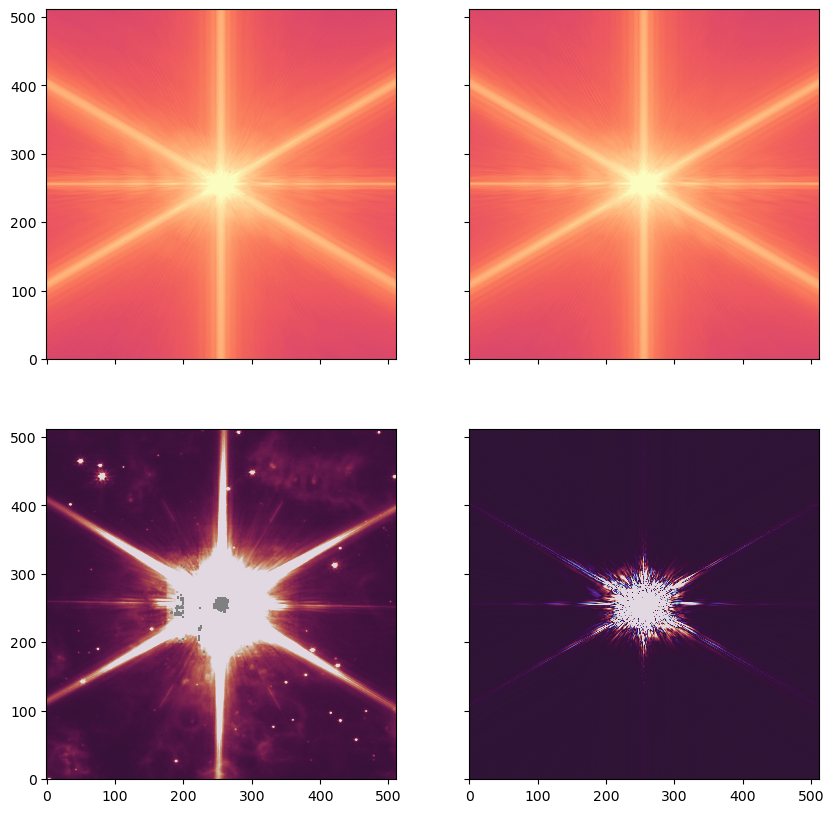

In [263]:
fig, ax = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10, 10))
norm = matplotlib.colors.LogNorm(vmin=0.0, vmax=1000.0)
cmap = matplotlib.cm.get_cmap("magma").copy()
cmap.set_bad("gray")
ax[0, 0].imshow(impsf2 / scale_psf, norm=norm, cmap=cmap)
ax[0, 1].imshow(impsf / scale_psf, norm=norm, cmap=cmap)
vscale = 10
cmap = matplotlib.cm.get_cmap("twilight").copy()
cmap.set_bad("gray")
ax[1, 0].imshow(
    (imobs / scale_obs), 
    vmin=-vscale, vmax=vscale, cmap=cmap)
ax[1, 1].imshow(
    (impsf2 / scale_psf) - (impsf / scale_psf), 
    vmin=-vscale, vmax=vscale, cmap=cmap)

...;

So there are differences, but they are small. 

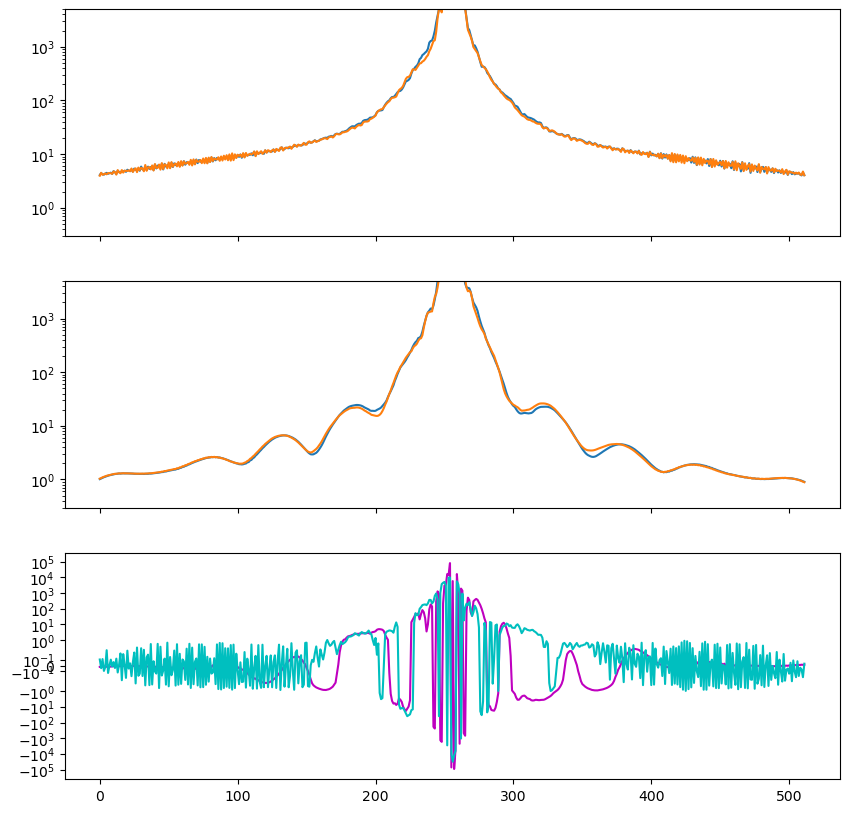

In [283]:
fig,  ax = plt.subplots(3, 1, sharex=True, figsize=(10, 10))
xcutpsf2 = np.nanmean(impsf2[:, 256-w:256+w], axis=1) / scale_psf
xcutpsf =np.nanmean(impsf[:, 256-w:256+w], axis=1) / scale_psf
ax[0].plot(xcutpsf2)
ax[0].plot(xcutpsf)
ax[0].set(yscale="log", ylim=[0.3, 5000.0])
ycutpsf2 = np.nanmean(impsf2[256-w:256+w, :], axis=0) / scale_psf
ycutpsf = np.nanmean(impsf[256-w:256+w, :], axis=0) / scale_psf
ax[1].plot(ycutpsf2)
ax[1].plot(ycutpsf)
ax[1].set(yscale="log", ylim=[0.3, 5000.0])
ax[2].plot(
    ycutpsf2 - ycutpsf,
    color="m",
)
ax[2].plot(
    xcutpsf2 - xcutpsf,
    color="c",
)
ax[2].set_yscale("symlog", linthresh=0.3, linscale=1)

...;

Blue is the new one, orange the old one. Magenta is horizontal cut, cyan is vertical cut.

#### Detector effects

Charge diffusion sees to be the most important. It is included as a gaussian smoothing of about 0.2 pixels. This is included in the `DET_DIST` and `OVERDIST` extensions. Let us see if it makes any difference. 

In [284]:
impsf2d = psf2["DET_DIST"].data

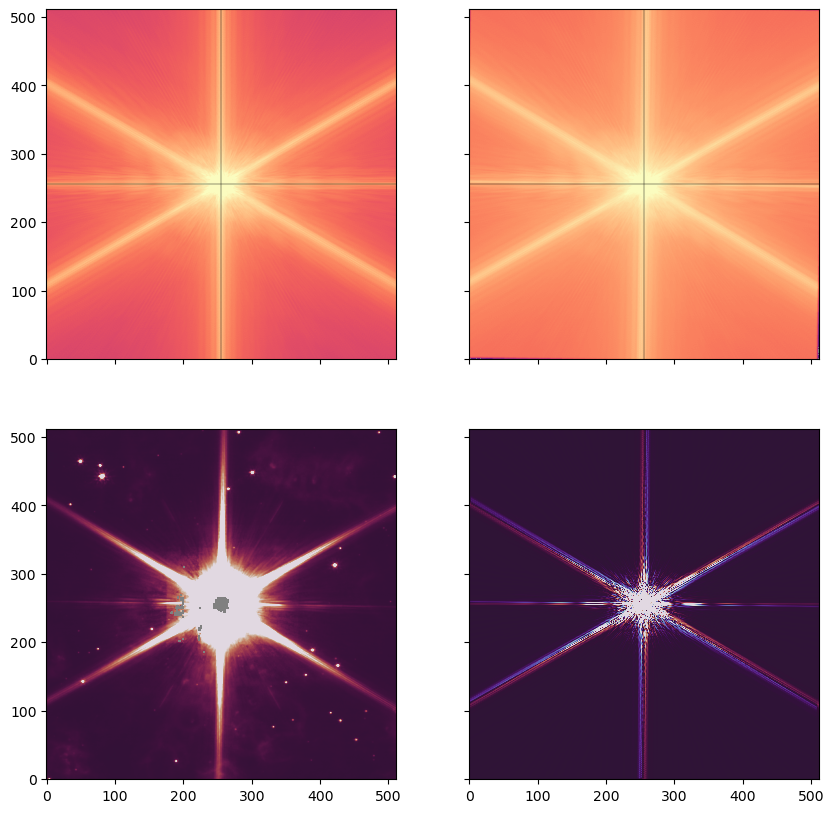

In [315]:
fig, ax = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10, 10))
norm = matplotlib.colors.LogNorm(vmin=0.0, vmax=1000.0)
cmap = matplotlib.cm.get_cmap("magma").copy()
cmap.set_bad("gray")
ax[0, 0].imshow(impsf2 / scale_psf, norm=norm, cmap=cmap)
ax[0, 1].imshow(impsf2d / scale_psf, norm=norm, cmap=cmap)
for _ax in ax[0, :]:
    _ax.axhline(255.5, color="k", linewidth=0.3)
    _ax.axvline(255.5, color="k", linewidth=0.3)
vscale = 20
cmap = matplotlib.cm.get_cmap("twilight").copy()
cmap.set_bad("gray")
ax[1, 0].imshow(
    (imobs / scale_obs), 
    vmin=-vscale, vmax=vscale, cmap=cmap)
ax[1, 1].imshow(
    (impsf2 / scale_psf) - (impsf2d / scale_psf), 
    vmin=-vscale, vmax=vscale, cmap=cmap)

...;

In [337]:
w = 1
cslice = slice(256-w, 256+w)
offset = np.arange(512) - 255.5
xcutpsf2 = np.nanmean(impsf2[:, cslice], axis=1) / scale_psf
ycutpsf2 = np.nanmean(impsf2[cslice, :], axis=0) / scale_psf
xcutpsf2d = np.nanmean(impsf2d[:, cslice], axis=1) / scale_psf
ycutpsf2d = np.nanmean(impsf2d[cslice, :], axis=0) / scale_psf

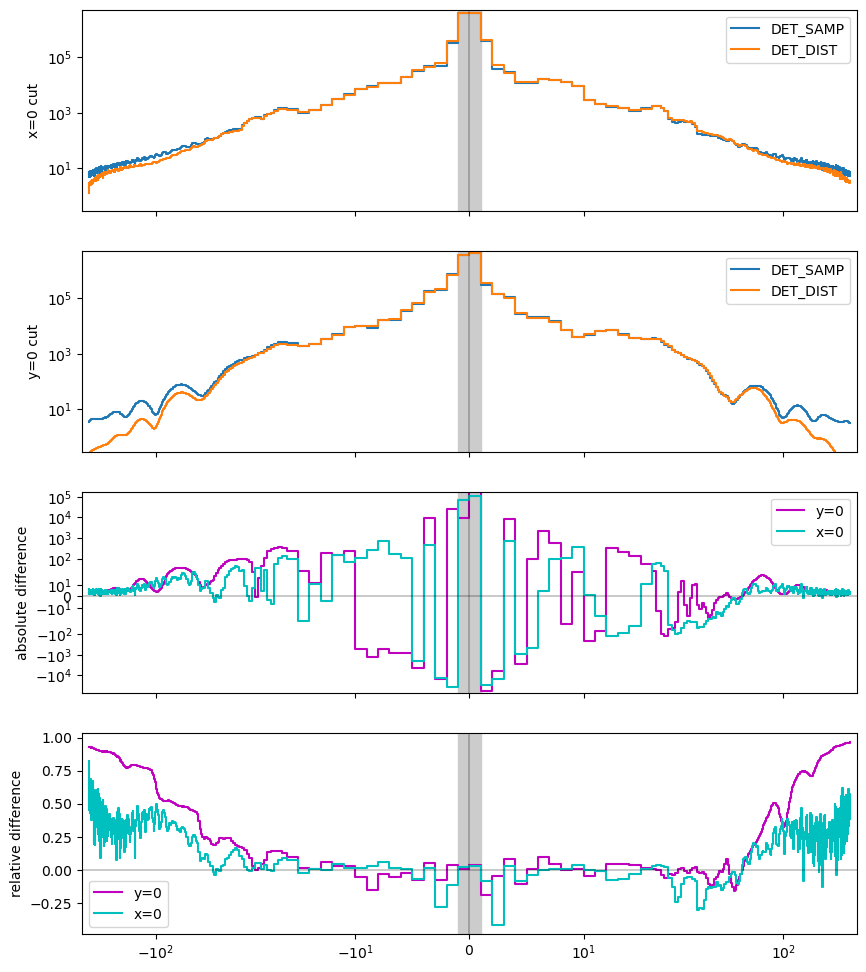

In [343]:
fig,  ax = plt.subplots(4, 1, sharex=True, figsize=(10, 12))
ax[0].plot(offset, xcutpsf2, drawstyle="steps-mid", label="DET_SAMP")
ax[0].plot(offset, xcutpsf2d, drawstyle="steps-mid", label="DET_DIST")
ax[0].set(yscale="log", ylim=[0.3, 5e6], ylabel="x=0 cut")
ax[1].plot(offset, ycutpsf2, drawstyle="steps-mid", label="DET_SAMP")
ax[1].plot(offset, ycutpsf2d, drawstyle="steps-mid", label="DET_DIST")
ax[1].set(yscale="log", ylim=[0.3, 5e6], ylabel="y=0 cut")
ax[2].plot(
    offset, 
    (ycutpsf2 - ycutpsf2d),
    color="m",
    drawstyle="steps-mid",
    label="y=0",
)
ax[2].plot(
    offset, 
    (xcutpsf2 - xcutpsf2d),
    color="c",
    drawstyle="steps-mid",
    label="x=0",
)
ax[2].set_ylabel("absolute difference")
ax[3].plot(
    offset, 
    (ycutpsf2 - ycutpsf2d) / ycutpsf2,
    color="m",
    drawstyle="steps-mid",
    label="y=0",
)
ax[3].plot(
    offset, 
    (xcutpsf2 - xcutpsf2d) / xcutpsf2,
    color="c",
    drawstyle="steps-mid",
    label="x=0",
)
ax[3].set_ylabel("relative difference")
for _ax in ax:
    _ax.axvspan(-1, 1, color="0.8")
    _ax.axvline(0.0, color="k", linewidth=0.3)
    _ax.legend()
for _ax in ax[2:]:
    _ax.axhline(0.0, color="k", linewidth=0.3)
ax[2].set_yscale("symlog", linthresh=20, linscale=1)
ax[3].set_yscale("linear")
ax[0].set_xscale("symlog", linthresh=16, linscale=1)
#ax[0].set_xticks([-256, -64, -16, -4, -1, 1, 4, 16, 64, 256])

...;

So the differences are pretty small. 

Now compare this `DET_DIST` psf with the observations.

In [410]:
scale_obs, scale_psf = 1.0, 2.8e-8

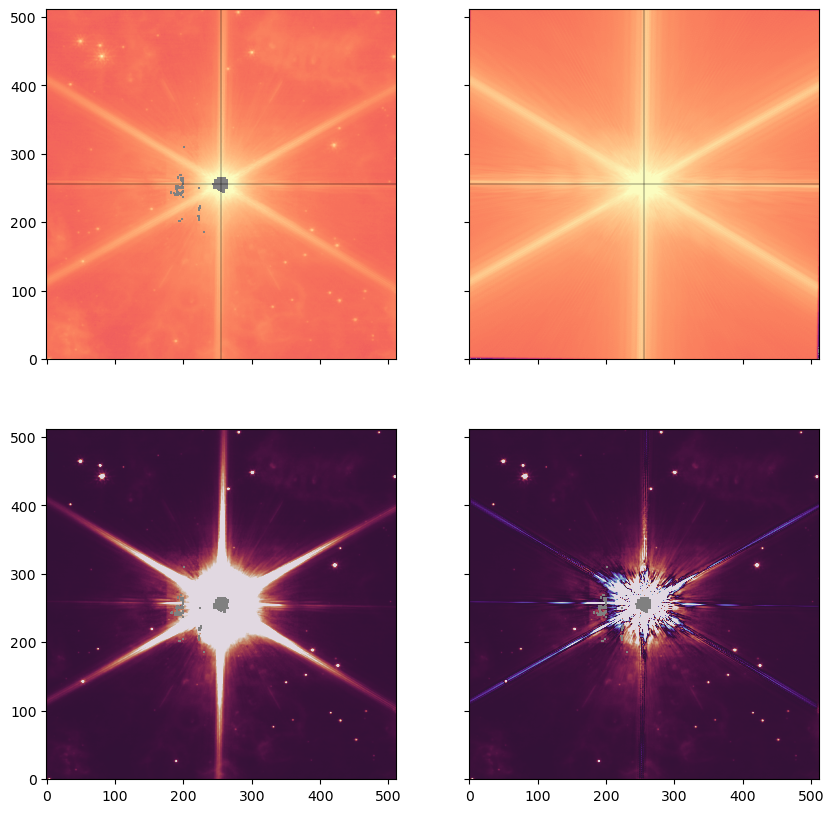

In [411]:
fig, ax = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10, 10))
norm = matplotlib.colors.LogNorm(vmin=0.0, vmax=1000.0)
cmap = matplotlib.cm.get_cmap("magma").copy()
cmap.set_bad("gray")
ax[0, 0].imshow(imobs / scale_obs, norm=norm, cmap=cmap)
ax[0, 1].imshow(impsf2d / scale_psf, norm=norm, cmap=cmap)
for _ax in ax[0, :]:
    _ax.axhline(255.5, color="k", linewidth=0.3)
    _ax.axvline(255.5, color="k", linewidth=0.3)
vscale = 20
cmap = matplotlib.cm.get_cmap("twilight").copy()
cmap.set_bad("gray")
ax[1, 0].imshow(
    (imobs / scale_obs), 
    vmin=-vscale, vmax=vscale, cmap=cmap)
ax[1, 1].imshow(
    (imobs / scale_obs) - (impsf2d / scale_psf), 
    vmin=-vscale, vmax=vscale, cmap=cmap)

...;

So we can do a reasonable job of removing the diffraction spikes, but at the cost of over-subtracting the central core, as can be seen in these vertical and horizontal profiles

In [412]:
w = 32
#cslice = slice(160-w, 160+w)
cslice = slice(256-w, 256+w)
offset = np.arange(512) - 255.5
masked_impsf2d = np.where(np.isfinite(imobs), impsf2d, np.nan)
xcutobs = np.nanmean(imobs[:, cslice], axis=1) / scale_obs
ycutobs = np.nanmean(imobs[cslice, :], axis=0) / scale_obs
xcutpsf2d = np.nanmean(masked_impsf2d[:, cslice], axis=1) / scale_psf
ycutpsf2d = np.nanmean(masked_impsf2d[cslice, :], axis=0) / scale_psf

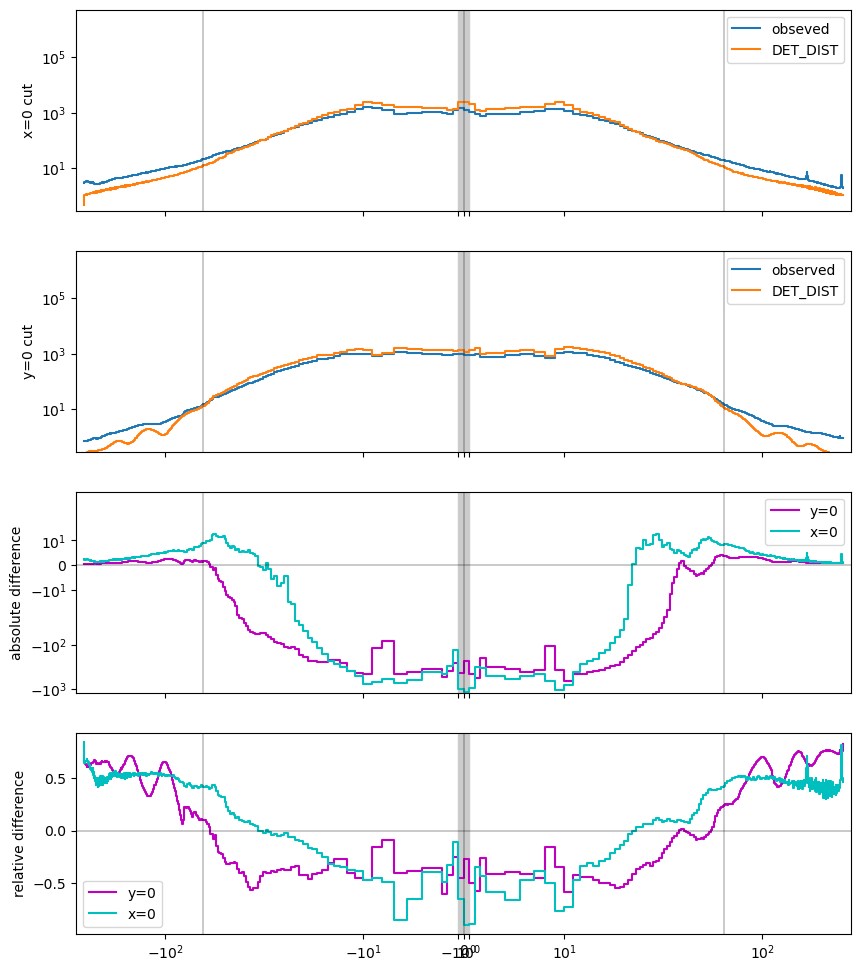

In [413]:
fig,  ax = plt.subplots(4, 1, sharex=True, figsize=(10, 12))
ax[0].plot(offset, xcutobs, drawstyle="steps-mid", label="obseved")
ax[0].plot(offset, xcutpsf2d, drawstyle="steps-mid", label="DET_DIST")
ax[0].set(yscale="log", ylim=[0.3, 5e6], ylabel="x=0 cut")
ax[1].plot(offset, ycutobs, drawstyle="steps-mid", label="observed")
ax[1].plot(offset, ycutpsf2d, drawstyle="steps-mid", label="DET_DIST")
ax[1].set(yscale="log", ylim=[0.3, 5e6], ylabel="y=0 cut")
ax[2].plot(
    offset, 
    (ycutobs - ycutpsf2d),
    color="m",
    drawstyle="steps-mid",
    label="y=0",
)
ax[2].plot(
    offset, 
    (xcutobs - xcutpsf2d),
    color="c",
    drawstyle="steps-mid",
    label="x=0",
)
ax[2].set_ylabel("absolute difference")
ax[3].plot(
    offset, 
    (ycutobs - ycutpsf2d) / ycutobs,
    color="m",
    drawstyle="steps-mid",
    label="y=0",
)
ax[3].plot(
    offset, 
    (xcutobs - xcutpsf2d) / xcutobs,
    color="c",
    drawstyle="steps-mid",
    label="x=0",
)
ax[3].set_ylabel("relative difference")
for _ax in ax:
    _ax.axvspan(-1, 1, color="0.8")
    _ax.axvline(0.0, color="k", linewidth=0.3)
    _ax.axvline(-64.0, color="k", linewidth=0.3)
    _ax.axvline(64.0, color="k", linewidth=0.3)
    _ax.legend()
for _ax in ax[2:]:
    _ax.axhline(0.0, color="k", linewidth=0.3)
ax[2].set_yscale("symlog", linthresh=20, linscale=1)
ax[3].set_yscale("linear")
ax[0].set_xscale("symlog", linthresh=4, linscale=0.1)

...;

#### What about if we move the star on the detector?

We want to see how much the psf will change if we adopt the corner pixels. We carry on with the auto-detected instrument configuration

In [415]:
inst.detector

'NRCB2'

In [418]:
inst.detector_position

(1024, 1024)

In [419]:
inst.detector_position = 0, 0
psf3 = inst.calc_psf(fov_pixels=512)

In [421]:
impsf3d = psf3["DET_DIST"].data

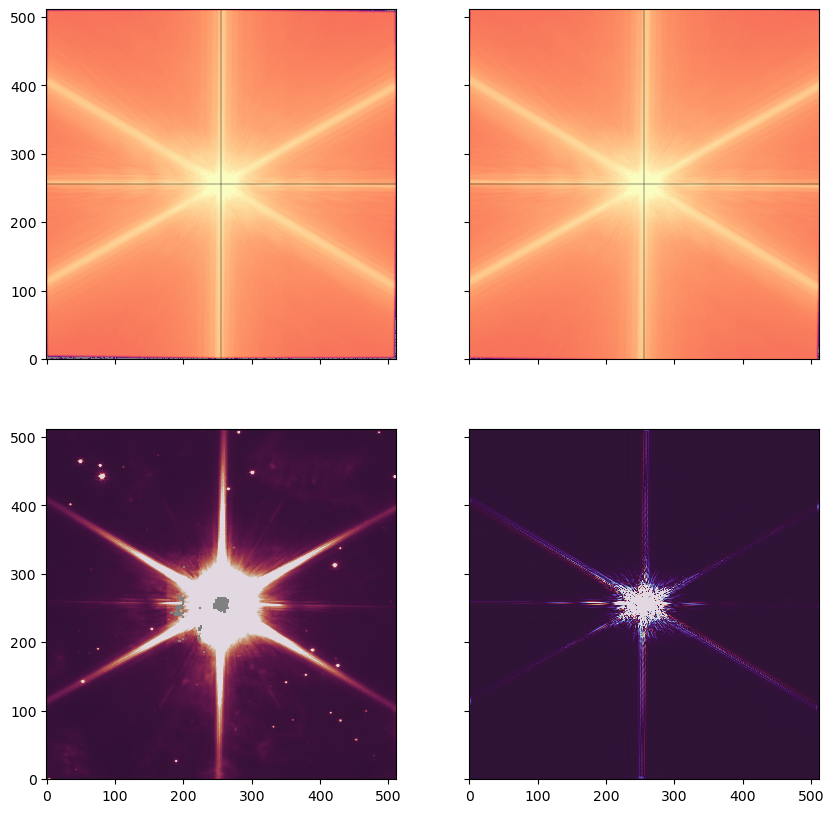

In [422]:
fig, ax = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10, 10))
norm = matplotlib.colors.LogNorm(vmin=0.0, vmax=1000.0)
cmap = matplotlib.cm.get_cmap("magma").copy()
cmap.set_bad("gray")
ax[0, 0].imshow(impsf3d / scale_psf, norm=norm, cmap=cmap)
ax[0, 1].imshow(impsf2d / scale_psf, norm=norm, cmap=cmap)
for _ax in ax[0, :]:
    _ax.axhline(255.5, color="k", linewidth=0.3)
    _ax.axvline(255.5, color="k", linewidth=0.3)
vscale = 20
cmap = matplotlib.cm.get_cmap("twilight").copy()
cmap.set_bad("gray")
ax[1, 0].imshow(
    (imobs / scale_obs), 
    vmin=-vscale, vmax=vscale, cmap=cmap)
ax[1, 1].imshow(
    (impsf3d / scale_psf) - (impsf2d / scale_psf), 
    vmin=-vscale, vmax=vscale, cmap=cmap)

...;

In [425]:
w = 5
cslice = slice(256-w, 256+w)
offset = np.arange(512) - 255.5
xcutpsf3d = np.nanmean(impsf3d[:, cslice], axis=1) / scale_psf
ycutpsf3d = np.nanmean(impsf3d[cslice, :], axis=0) / scale_psf
xcutpsf2d = np.nanmean(impsf2d[:, cslice], axis=1) / scale_psf
ycutpsf2d = np.nanmean(impsf2d[cslice, :], axis=0) / scale_psf

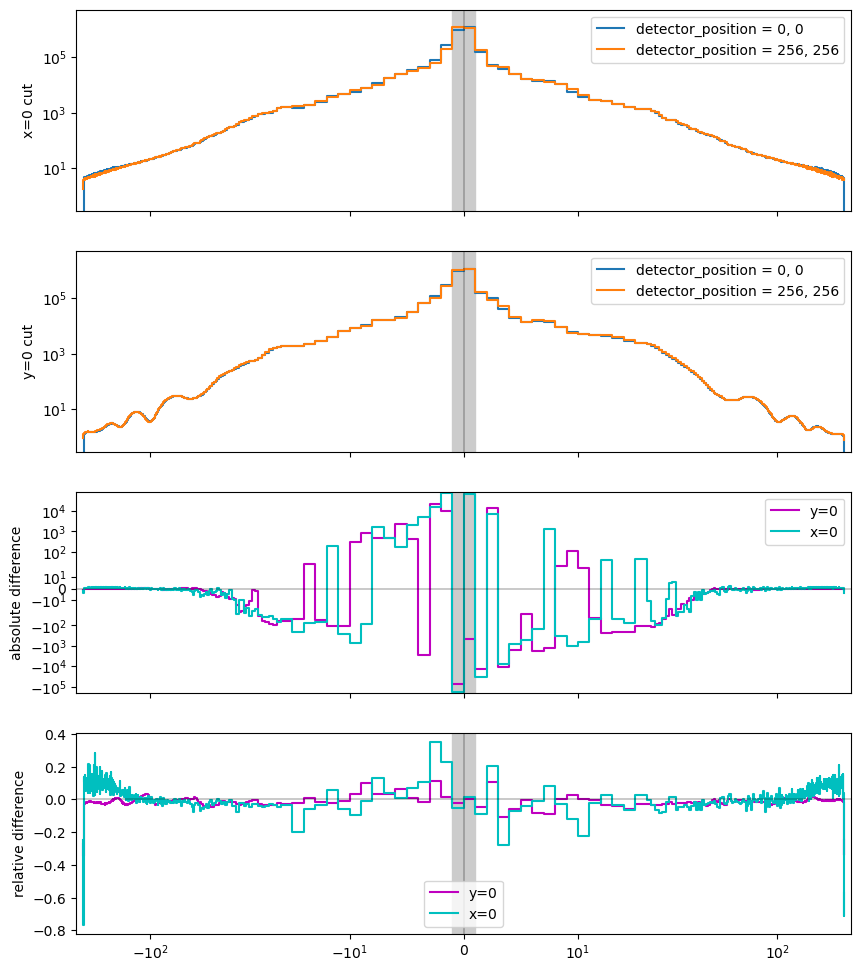

In [426]:
fig,  ax = plt.subplots(4, 1, sharex=True, figsize=(10, 12))
ax[0].plot(offset, xcutpsf3d, drawstyle="steps-mid", label="detector_position = 0, 0")
ax[0].plot(offset, xcutpsf2d, drawstyle="steps-mid", label="detector_position = 256, 256")
ax[0].set(yscale="log", ylim=[0.3, 5e6], ylabel="x=0 cut")
ax[1].plot(offset, ycutpsf3d, drawstyle="steps-mid", label="detector_position = 0, 0")
ax[1].plot(offset, ycutpsf2d, drawstyle="steps-mid", label="detector_position = 256, 256")
ax[1].set(yscale="log", ylim=[0.3, 5e6], ylabel="y=0 cut")
ax[2].plot(
    offset, 
    (ycutpsf3d - ycutpsf2d),
    color="m",
    drawstyle="steps-mid",
    label="y=0",
)
ax[2].plot(
    offset, 
    (xcutpsf3d - xcutpsf2d),
    color="c",
    drawstyle="steps-mid",
    label="x=0",
)
ax[2].set_ylabel("absolute difference")
ax[3].plot(
    offset, 
    (ycutpsf3d - ycutpsf2d) / ycutpsf2,
    color="m",
    drawstyle="steps-mid",
    label="y=0",
)
ax[3].plot(
    offset, 
    (xcutpsf3d - xcutpsf2d) / xcutpsf2,
    color="c",
    drawstyle="steps-mid",
    label="x=0",
)
ax[3].set_ylabel("relative difference")
for _ax in ax:
    _ax.axvspan(-1, 1, color="0.8")
    _ax.axvline(0.0, color="k", linewidth=0.3)
    _ax.legend()
for _ax in ax[2:]:
    _ax.axhline(0.0, color="k", linewidth=0.3)
ax[2].set_yscale("symlog", linthresh=20, linscale=1)
ax[3].set_yscale("linear")
ax[0].set_xscale("symlog", linthresh=16, linscale=1)
#ax[0].set_xticks([-256, -64, -16, -4, -1, 1, 4, 16, 64, 256])

...;

So the differences are quite small when you average over 10 pixel strips, but are larger for individual columns and rows. 

For the outer spikes, it mainly seems to be a difference in the rotation distorsion term.

# Empirical psf from medium brightness stars

We will use the ones that are not the central star but are still bright. Look at smaller cutout stamps. 

In [427]:
len(bright_peaks)

53

In [449]:
im_sub = fits.open(datapath / "wr124-jwst-nircam-2022-f090w_BGSUB.fits")[0].data

We use the bg-subtracted image for constructing the empirical psf

In [474]:
im_stamps = []
wstamp = 64
for j, i in bright_peaks:
    im_stamps.append(Cutout2D(im_sub, (i, j), size=wstamp, copy=True, mode="partial"))

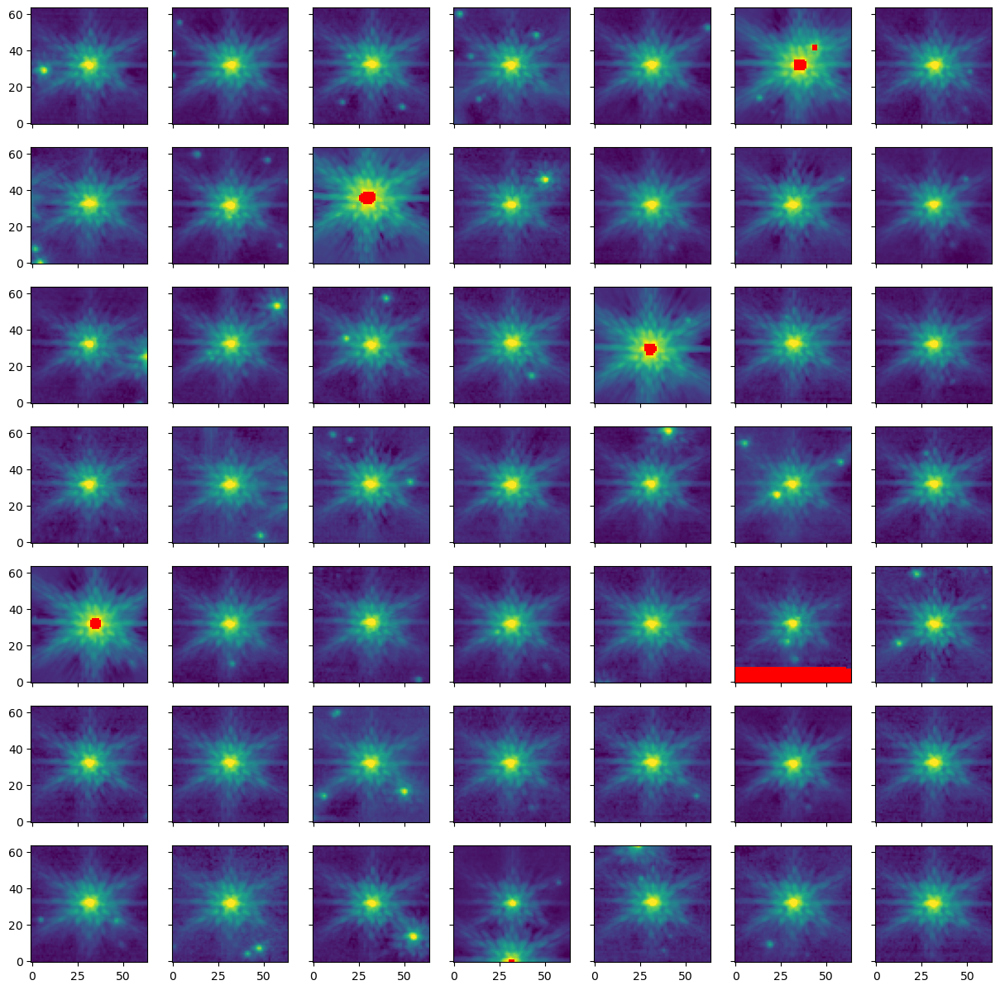

In [484]:
fig, axes = plt.subplots(7, 7, sharex=True, sharey=True, figsize=(15, 15))
cmap = matplotlib.cm.get_cmap("viridis").copy()
cmap.set_bad("red")
for ax, im in zip(axes.flat, im_stamps[1:]):
    try:
        norm = av.simple_norm(im.data, percent=99.5, stretch='log')
    except:
        norm = None
    ax.imshow(im.data, norm=norm, cmap=cmap)

These look really good and suggest that an empirical psf can be derived relatively easily. 

1. [X] We should use the BGSUB image
2. [ ] Interpolate away any nans
3. [ ] We need to find the centroid of each star to sub-pixel precision - easiest to fit a 2d gaussian to the central box
4. [ ] Then normalize all the images, using the peaks of the same Gaussians, and regrid to a common finer grid (pegged to the star centroid)
5. [ ] Do some sigma clipping on each pixel to reject outliers, such as other stars in the field
6. [ ] Then add them all together (unnormalized and with each one muptiplied by its corresponding weight image)
7. [ ] We could also propagate the error image an

This should give a subsampled empirical psf, which would probably work better than the webbpsf one for the central part at least. 

## First fit the centroids


We can do this on the big image if we make use of bounding_box to restrict the evaluation of the model. 

### We also want to interpolate the nans away

Remember that this is only for finding the centroids, not for actually modeling the psf. I use a box kernel, since we are not interested in the interpolared values really. 

In [479]:
im_subi = interpolate_replace_nans(im_sub, kernel=Box2DKernel(9))

Lots of nans remain around the edges and in the bright central star, but we need to check that it has fixed all the other bright stars:

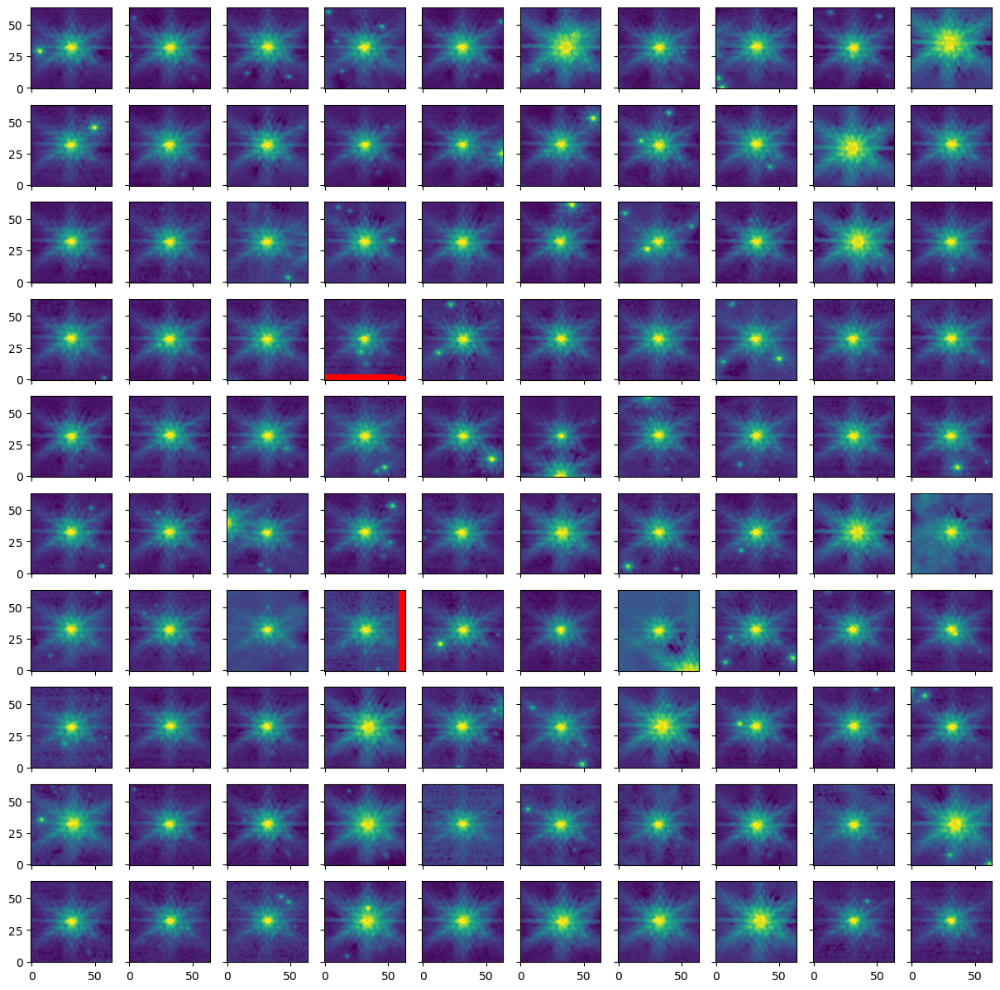

In [688]:
stamps = []
wstamp = 64
for j, i in bright_peaks:
    stamps.append(Cutout2D(im_subi, (i, j), size=wstamp, copy=True, mode="partial"))
    
fig, axes = plt.subplots(10, 10, sharex=True, sharey=True, figsize=(15, 15))
for ax, im in zip(axes.flat, stamps[1:]):
    try:
        norm = av.simple_norm(im.data, percent=99.5, stretch='log')
    except:
        norm = None
    ax.imshow(im.data, norm=norm, cmap=cmap)

That seems to have worked - all red cores eliminated. 

### Test how the bounding box works for `Gaussian2D` model

In [497]:
g = models.Gaussian2D(amplitude=100, x_mean=100, y_mean=20, x_stddev=1, y_stddev=2)
g.bounding_box.bounding_box()

((9.0, 31.0), (94.5, 105.5))

It seems to take a 5 sigma box around the initial central position. I am guessing that this will not move during the fitting, so we do not need to set it explicitly. If we want to make it bigger or smaller, we can just change the initial sigma. 

### Do the fitting

It turns out that the previous two sections were unnecessary. It is better to use the original array wit nans in for the saturated sources. And the `bounding_box` does not get used in the fitting, so I use `Cutout2D()` to get a small stamp to work with 

We do need the pixel coordinates as explicit arrays. I used to do a complicated thing with arange and griddata to get these, but is now much simpler using `np.indices()`

In [505]:
ypixels, xpixels = np.indices(im_subi.shape)
xpixels, ypixels

(array([[   0,    1,    2, ..., 4669, 4670, 4671],
        [   0,    1,    2, ..., 4669, 4670, 4671],
        [   0,    1,    2, ..., 4669, 4670, 4671],
        ...,
        [   0,    1,    2, ..., 4669, 4670, 4671],
        [   0,    1,    2, ..., 4669, 4670, 4671],
        [   0,    1,    2, ..., 4669, 4670, 4671]]),
 array([[   0,    0,    0, ...,    0,    0,    0],
        [   1,    1,    1, ...,    1,    1,    1],
        [   2,    2,    2, ...,    2,    2,    2],
        ...,
        [4663, 4663, 4663, ..., 4663, 4663, 4663],
        [4664, 4664, 4664, ..., 4664, 4664, 4664],
        [4665, 4665, 4665, ..., 4665, 4665, 4665]]))

Here is the function that does the fitting. Required arguments are `im` the full-size image and (`i0`, `j0`) the pixel coordinates of the peak that we wish to fit (for saturated stars these will be diplaced from the center, so you may want to increase `stamp_size` in those cases to ensure that the star is fully enclosed).

In [574]:
def fit_star_centroid(im, i0, j0, initial_sigma=1.5, stamp_size=15, fit=fitting.LMLSQFitter()):
    # Get pixel coordinates of the full image
    yfull, xfull = np.indices(im.shape)
    # Cutout stamp around the peak pixel
    imcutout = Cutout2D(im, (i0, j0), size=stamp_size, copy=True, mode="partial")
    xcutout = Cutout2D(xfull, (i0, j0), size=stamp_size, copy=True, mode="partial")
    ycutout = Cutout2D(yfull, (i0, j0), size=stamp_size, copy=True, mode="partial")
    # Initialize gaussian model
    g0 = models.Gaussian2D(
        amplitude=im[j0, i0], 
        x_mean=i0, y_mean=j0, 
        x_stddev=initial_sigma, y_stddev=initial_sigma,
    )
    # Fit model to non-NaN pixels
    m = np.isfinite(imcutout.data)
    g = fit(g0, xcutout.data[m], ycutout.data[m], imcutout.data[m])
    # Stuff extra attributes onto the cutout stamp
    imcutout.xdata = xcutout.data
    imcutout.ydata = ycutout.data
    # Save image of the fitted model (note we do not use g.render())
    imcutout.fit_data = g(imcutout.xdata, imcutout.ydata)
    return {"cutout": imcutout, "model": g}

#### Test with the bright central star

This is not a typical case

In [662]:
j0, i0 = bright_peaks[0]
i0, j0

(2327, 2322)

In [677]:
cutout, model = fit_star_centroid(im_sub, i0, j0, stamp_size=511).values()

In [678]:
model

<Gaussian2D(amplitude=5558.53992243, x_mean=2315.60415766, y_mean=2321.96429515, x_stddev=8.06733163, y_stddev=9.55767369, theta=-70.82369225)>

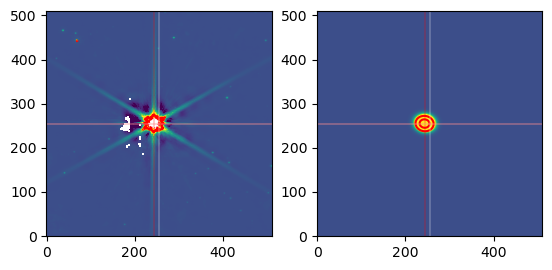

In [681]:
xc, yc = cutout.to_cutout_position((model.x_mean, model.y_mean))
fig, axes = plt.subplots(1, 2)
norm = av.simple_norm(cutout.data, percent=99, stretch='sqrt')
axes[0].imshow(cutout.data, norm=norm)
#axes[0].scatter(xc, yc, marker="x", color="r")
axes[1].imshow(cutout.fit_data, norm=norm)
ny, nx = cutout.shape
levels = model.amplitude * np.array((0.1, 0.5))
axes[0].contour(cutout.data, colors="r", levels=levels)
axes[1].contour(cutout.fit_data, colors="r", levels=levels)
for ax in axes:
    ax.axhline(yc, linewidth=0.3, color="r")
    ax.axvline(xc, linewidth=0.3, color="r")
    ax.axhline((ny-1)/2, linewidth=0.3, color="w")
    ax.axvline((nx-1)/2, linewidth=0.3, color="w")

Better to use the original image with NaNs

#### Apply to all the bright sources

Note we cannot use `model` as a variable name since it is a package name in `astropy.modeling`

In [690]:
cutouts = []
gmodels = []
for j0, i0 in bright_peaks[1:]:
    rslt = fit_star_centroid(im_sub, i0, j0)
    cutouts.append(rslt["cutout"])
    gmodels.append(rslt["model"])

#### Make a table of the fit results

In [691]:
dict(zip(gmodels[0].param_names, gmodels[0].parameters))

{'amplitude': 5340.413425486105,
 'x_mean': 997.2684173790929,
 'y_mean': 3445.7681047143014,
 'x_stddev': 0.6931945740824871,
 'y_stddev': 0.5610337138945999,
 'theta': -0.16551263614581196}

In [624]:
import pandas as pd

In [692]:
df = pd.DataFrame(dict(zip(_.param_names, _.parameters)) for _ in gmodels) 

We are mainly interested in the average sigma, but also calculate the ellipicity a/b

In [698]:
df["sigma"] = np.hypot(df["x_stddev"], df["y_stddev"])
df["a_b"] = df["x_stddev"] / df["y_stddev"]

Count the NaNs in each cutout to detect which stars are saturated

In [711]:
df["nan_count"] = [np.sum(~np.isfinite(_.data)) for _ in cutouts]

In [714]:
saturated = df["nan_count"] > 0

In [715]:
df[saturated]

,amplitude,x_mean,y_mean,x_stddev,y_stddev,theta,sigma,a_b,nan_count
5,2773.723485,4368.436327,2206.842723,3.614661,3.152475,0.043797,4.796235,1.146610,28
9,3160.391260,3301.345289,2589.519828,3.434290,4.448829,9.399849,5.620180,0.771954,38
18,2629.621872,3682.860529,2677.553571,3.286775,3.512414,-9.730508,4.810400,0.935759,24
28,2088.651306,4197.928689,1125.912042,3.310705,2.748861,0.133969,4.303139,1.204392,21
55,1505.161592,3251.217937,2992.682115,1.413863,0.868420,-0.241149,1.659266,1.628086,2
58,1312.379632,1613.209188,2497.498915,3.408058,2.711409,0.246792,4.355066,1.256933,14
73,783.713578,248.690630,3303.691741,3.000804,2.194773,0.036008,3.717776,1.367250,10
76,962.705733,2236.505466,4316.351718,3.491500,2.506596,0.124180,4.298092,1.392925,14
80,1208.900672,1498.801210,4557.363350,2.203690,1.182259,0.037805,2.500797,1.863966,5
83,1069.017713,2779.679773,555.811879,2.793991,1.974269,0.003788,3.421129,1.415203,9


In [716]:
df[~saturated]

,amplitude,x_mean,y_mean,x_stddev,y_stddev,theta,sigma,a_b,nan_count
0,5340.413425,997.268417,3445.768105,0.693195,0.561034,-0.165513,0.891783,1.235567,0
1,5164.544136,3589.361507,484.146860,0.673073,0.633325,0.145017,0.924190,1.062760,0
2,5274.598421,2786.351764,4256.195279,0.724446,0.561991,-0.200016,0.916873,1.289070,0
3,4456.577277,2858.688280,2885.032324,0.629767,0.588108,-0.244148,0.861671,1.070837,0
4,4407.963613,1884.622363,835.145033,0.754184,0.816323,-0.075717,1.111385,0.923879,0
...,...,...,...,...,...,...,...,...,...
113,1338.442038,3905.491086,3517.895564,0.751441,0.692196,-0.353131,1.021665,1.085589,0
114,1306.369076,3246.810374,345.489344,0.741485,0.763872,-2.156158,1.064566,0.970693,0
117,1048.827342,2952.165963,3377.972183,0.781410,0.757015,-0.702605,1.087968,1.032226,0
119,1173.250366,27.569903,618.867014,0.807193,0.702694,-0.187176,1.070205,1.148713,0


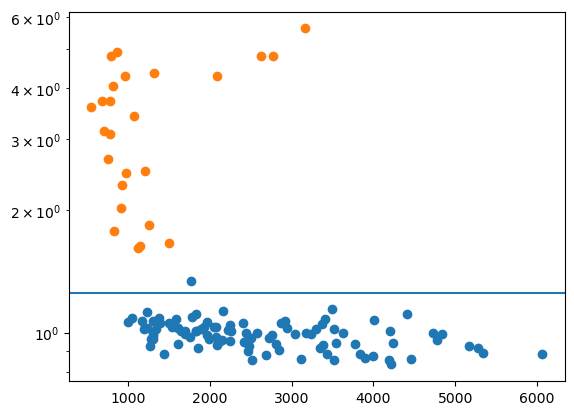

In [717]:
fig, ax = plt.subplots()
ax.scatter("amplitude", "sigma", data=df[~saturated])
ax.scatter("amplitude", "sigma", data=df[saturated])
ax.axhline(1.25)
ax.set_yscale('log')

So we can choose the stars with sigma < 1.25, since they are not saturated. 

The unsaturated stars are slightly non-circular, with a/b clustered around 1.1. The saturated stars (orange have a wider range of a/b)

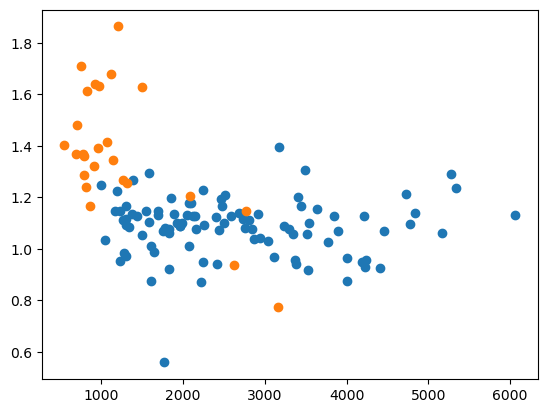

In [718]:
fig, ax = plt.subplots()
ax.scatter("amplitude", "a_b", data=df[~saturated])
ax.scatter("amplitude", "a_b", data=df[saturated])
#ax.set_ylim(0.0, 1.5)

Note that going forward the only thing we use from these fits is the position of the centroid

## Then project them onto a finer grid, so we can align them and average them better

One way of doing this is to setup a wcs with origin at the gaussian centroid and with 8 times over-sampling. 

We also need a WCS of the entire original image, but in pixels instead of celestial coordinates. We set CRPIX = 1 and CRVAL = 0, so it gives us python-style 0-based pixel numbering. 

In [735]:
wcs_pix = WCS()
wcs_pix.pixel_shape = im_sub.shape
wcs_pix.wcs.crpix = [1, 1]
wcs_pix.wcs.cunit = ["pixel", "pixel"]
wcs_pix.wcs.cname = ["x", "y"]
wcs_pix.wcs.ctype = ["pos.cartesian.x", "pos.cartesian.y"]
wcs_pix

WCS Keywords

Number of WCS axes: 2
CTYPE : 'pos.cartesian.x' 'pos.cartesian.y' 
CRVAL : 0.0 0.0 
CRPIX : 1.0 1.0 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 1.0 1.0 
NAXIS : 4666  4672

### Test of doing a cutout with the wcs

In [736]:
gmodel = gmodels[0]
x0, y0 = gmodel.x_mean.value, gmodel.y_mean.value
x0, y0 

(997.2684173790929, 3445.7681047143014)

First check that the pixel WCS for the original image is working as it should (converting pixels to pixels!)

In [737]:
wcs_pix.world_to_pixel(x0 * u.pix, y0 * u.pix)

(array(997.26841738), array(3445.76810471))

Yes, that works as expected (identity operation). 

So now check that the wcs is transformed correctly for the cutout image. 

In [738]:
cutout = Cutout2D(
    im_sub, 
    (gmodel.x_mean.value, gmodel.y_mean.value), 
    size=15, wcs=wcs_pix, copy=True, mode="partial",
)
cutout.wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'pos.cartesian.x' 'pos.cartesian.y' 
CRVAL : 0.0 0.0 
CRPIX : -989.0 -3438.0 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 1.0 1.0 
NAXIS : 15  15

If all is well, then the central pixel (7, 7) should be close to the model centroid.

In [739]:
cutout.wcs.pixel_to_world(7, 7)

[<Quantity 997. pix>, <Quantity 3446. pix>]

This is as close as can be managed since the cutout is confined to integer pixels. 

### Function to get an oversampled, centered cutout image

In [972]:
def oversampled_centered_cutout(im, wcsi, xcenter, ycenter, oversample=8, size=15):
    """Produce a cutout from `im` of `size` x `size` pixels oversampled by `oversample`"""
    # Set up the output oversampled cutout wcs
    wcso = WCS()
    wcso.pixel_shape = oversample * size, oversample * size
    wcso.wcs.cdelt = [1 / oversample, 1 / oversample]
    wcso.wcs.crpix = (np.array(wcso.pixel_shape) + 1) / 2
    wcso.wcs.crval = xcenter, ycenter
    wcso.wcs.cunit = ["pixel", "pixel"]
    wcso.wcs.cname = ["x", "y"]
    wcso.wcs.ctype = ["pos.cartesian.x", "pos.cartesian.y"]

    # Get cutout of original pixel grid
    # We add borders of 1 pixel to make sure oversampled grid is fully enveloped
    cutout = Cutout2D(
        im, 
        (xcenter, ycenter), 
        size=size + 2, wcs=wcsi, copy=True, mode="partial",
    )    

    # Reproject onto oversampled grid
    imo = reproject_interp(
        (cutout.data, cutout.wcs), 
        wcso, 
        wcso.pixel_shape, 
        order="nearest-neighbor",
        return_footprint=False,
    )

    # retutn the oversampled image and the original cutout data
    return imo, cutout.data

In [770]:
imo, imc = oversampled_centered_cutout(im_sub, wcs_pix, x0, y0)

In [771]:
imo

array([[3.39972938, 3.39972938, 3.39972938, ..., 4.88848781, 2.95193818,
        2.95193818],
       [3.39972938, 3.39972938, 3.39972938, ..., 4.88848781, 2.95193818,
        2.95193818],
       [5.49067268, 5.49067268, 5.49067268, ..., 5.45759203, 5.10815265,
        5.10815265],
       ...,
       [2.42779032, 2.42779032, 2.42779032, ..., 3.97519906, 2.60382623,
        2.60382623],
       [2.42779032, 2.42779032, 2.42779032, ..., 3.97519906, 2.60382623,
        2.60382623],
       [2.42779032, 2.42779032, 2.42779032, ..., 3.97519906, 2.60382623,
        2.60382623]])

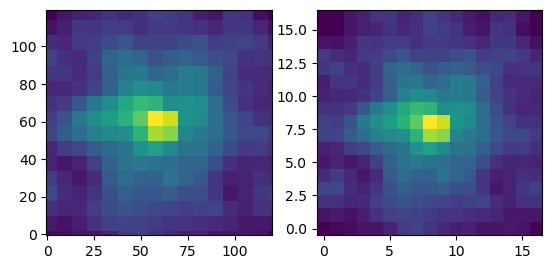

In [814]:
fig, ax = plt.subplots(1, 2)
norm = av.simple_norm(imo, percent=99.5, stretch='log')
ax[0].imshow(imo, norm=norm)
ax[1].imshow(imc, norm=norm)

Yay, this looks great. They look identical, except that the oversampled one has more and smaller pixels. 

### Apply the oversampling to all the unsaturated stars

Separate the models into saturated and unsaturated stars

In [797]:
xy_saturated = [
    (gm.x_mean.value, gm.y_mean.value) 
    for gm, sat in zip(gmodels, saturated.tolist()) 
    if sat
]
xy_unsaturated = [
    (gm.x_mean.value, gm.y_mean.value) 
    for gm, sat in zip(gmodels, saturated.tolist()) 
    if not sat
]
len(xy_unsaturated)

97

And get a stack of the oversampled images

In [846]:
ocutouts = np.stack(
    list(
        oversampled_centered_cutout(im_sub, wcs_pix, x0, y0, size=128, oversample=8)[0] 
        for (x0, y0) in xy_unsaturated
    )
)

### Normalize and sigma-clip the stack

Use the central core to normalize

In [847]:
n = ocutouts.shape[-1]
cslice = slice(n//2 - 1, n//2 + 2)
peaks = np.mean(ocutouts[:, cslice, cslice], axis=(1, 2), keepdims=True)
ocutouts_norm = ocutouts / peaks
np.nanmax(ocutouts_norm, axis=(1, 2))

array([1.        , 1.10568962, 1.07739738, 1.        , 1.        ,
       1.04360727, 1.16614744, 1.02719413, 1.        , 1.        ,
       1.070504  , 1.        , 1.        , 1.06762006, 1.        ,
       1.10922919, 1.07426853, 1.        , 1.        , 1.37397856,
       1.        , 1.38944062, 1.00496868, 1.        , 1.        ,
       1.03026111, 1.02757045, 1.        , 1.04167692, 1.        ,
       1.02684249, 1.        , 1.01595686, 1.11198688, 1.17592275,
       1.09815112, 1.        , 1.        , 1.03058777, 1.        ,
       1.08780406, 1.        , 1.1286266 , 1.05949184, 1.        ,
       1.05758124, 1.        , 1.06879847, 1.74313061, 1.05879913,
       1.05657412, 1.        , 1.        , 1.07966918, 1.09513814,
       1.04838301, 1.        , 1.11811622, 1.03750802, 1.        ,
       1.        , 1.03882607, 1.05913839, 1.07085224, 1.        ,
       1.15184376, 1.        , 1.02057023, 1.08529993, 1.03869684,
       1.02572729, 1.11305264, 1.        , 1.09394078, 1.     

These are mostly close to unity, which is good enough.

Now do sigma clipping, which turns outlier pixels to NaNs

In [848]:
ocutouts_norm = sigma_clip(ocutouts_norm, sigma=3.0, axis=0)

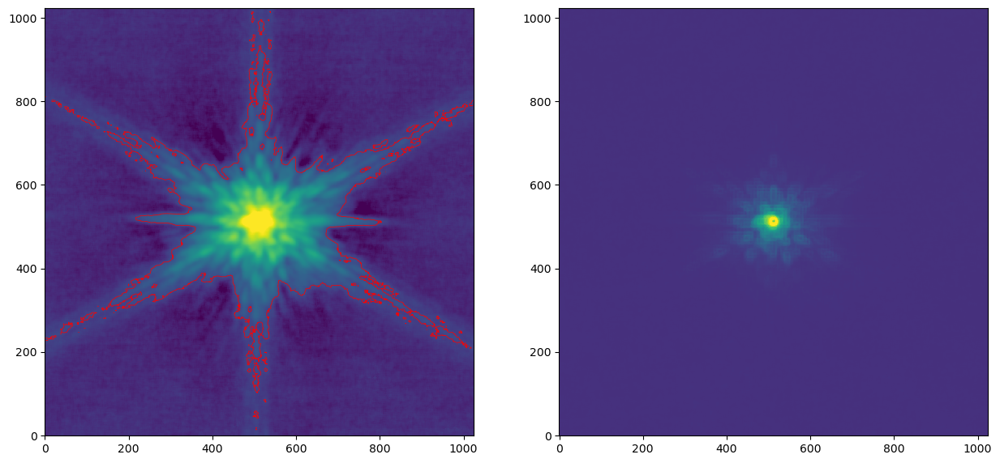

In [903]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
osum = np.nansum(ocutouts_norm, axis=0)
omean = np.nanmean(ocutouts_norm, axis=0)
ostd = np.nanstd(ocutouts_norm, axis=0)
neff = ocutouts.shape[0]
osem = ostd / np.sqrt(neff)
s_n = omean / osem
norm = av.simple_norm(omean, percent=99.5, stretch='log')
ax[0].imshow(omean, norm=norm)
ax[1].imshow(osem, norm=norm)
ax[0].contour(s_n, levels=[10], colors='r', linewidths=0.5)

So his looks pretty good. We have a s/n > 10 (red contour) out to a radius of 300 oversasmpled pixels, or 40 original pixels. I do not really believe that about the s/n. It looks better than that. 

Now, propagate the NaNs back to the stackof peaks, so we can properly weight the average. 

In [878]:
peaks_or_nan = np.where(np.isfinite(ocutouts_norm), peaks, np.nan)

In [900]:
omean2 = np.nansum(ocutouts_norm * peaks_or_nan, axis=0) / np.nansum(peaks_or_nan, axis=0)
ovar2 = np.nansum(((ocutouts_norm - omean2) ** 2) * peaks_or_nan, axis=0) / np.nansum(peaks_or_nan, axis=0)
ostd2 = np.sqrt(ovar2)

We need the effective number of observations to convert from std to s.e.m.  

This can be approximated as the sum of the normalizations dividied by the maximum normalization

In [905]:
neff = np.sum(peaks) / np.max(peaks)
neff

44.30906841792161

In [906]:
osem2 = ostd2 / np.sqrt(neff)

In [880]:
np.max(omean2), np.max(omean)

(1.0097296606542672, 1.017765830221329)

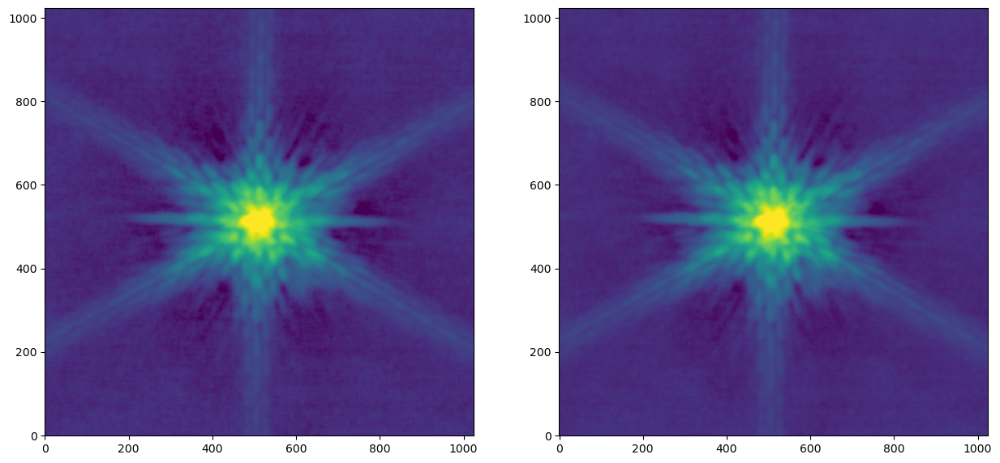

In [881]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
norm = av.simple_norm(omean, percent=99.5, stretch='log')
ax[0].imshow(omean, norm=norm)
ax[1].imshow(omean2, norm=norm)

So the right-hand one is properly weighted, so should have slightly smaller noise. 

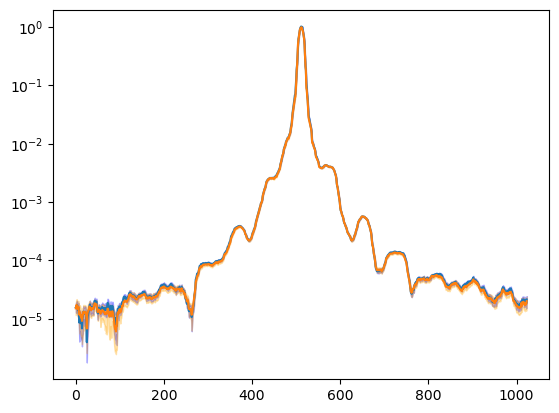

In [919]:
fig, ax = plt.subplots()
ipix = 512
ax.plot(omean[:, ipix])
ax.plot(omean2[:, ipix])
ax.fill_between(np.arange(1024), omean[:, ipix] - osem[:, ipix], omean[:, ipix] + osem[:, ipix], color='b', alpha=0.3)
ax.fill_between(np.arange(1024), omean2[:, ipix] - osem2[:, ipix], omean2[:, ipix] + osem2[:, ipix], color='orange', alpha=0.3)

ax.set_yscale("symlog", linthresh=1e-5, linscale=1)


In [893]:
slices

(slice(500, 501, None), slice(None, None, None))

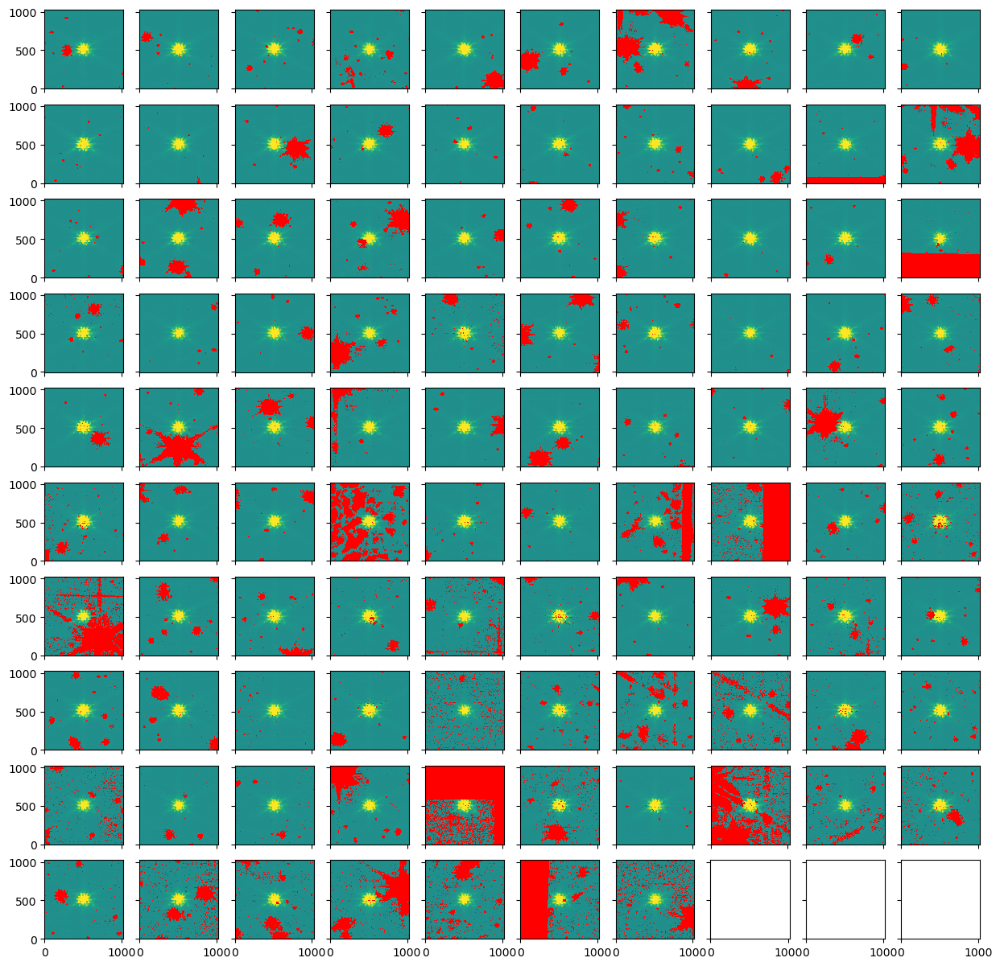

In [876]:
fig, axes = plt.subplots(10, 10, sharex=True, sharey=True, figsize=(15, 15))
for ax, im in zip(axes.flat, ocutouts_norm):
    ax.imshow(im, vmin=-0.003, vmax=0.003, cmap=cmap)

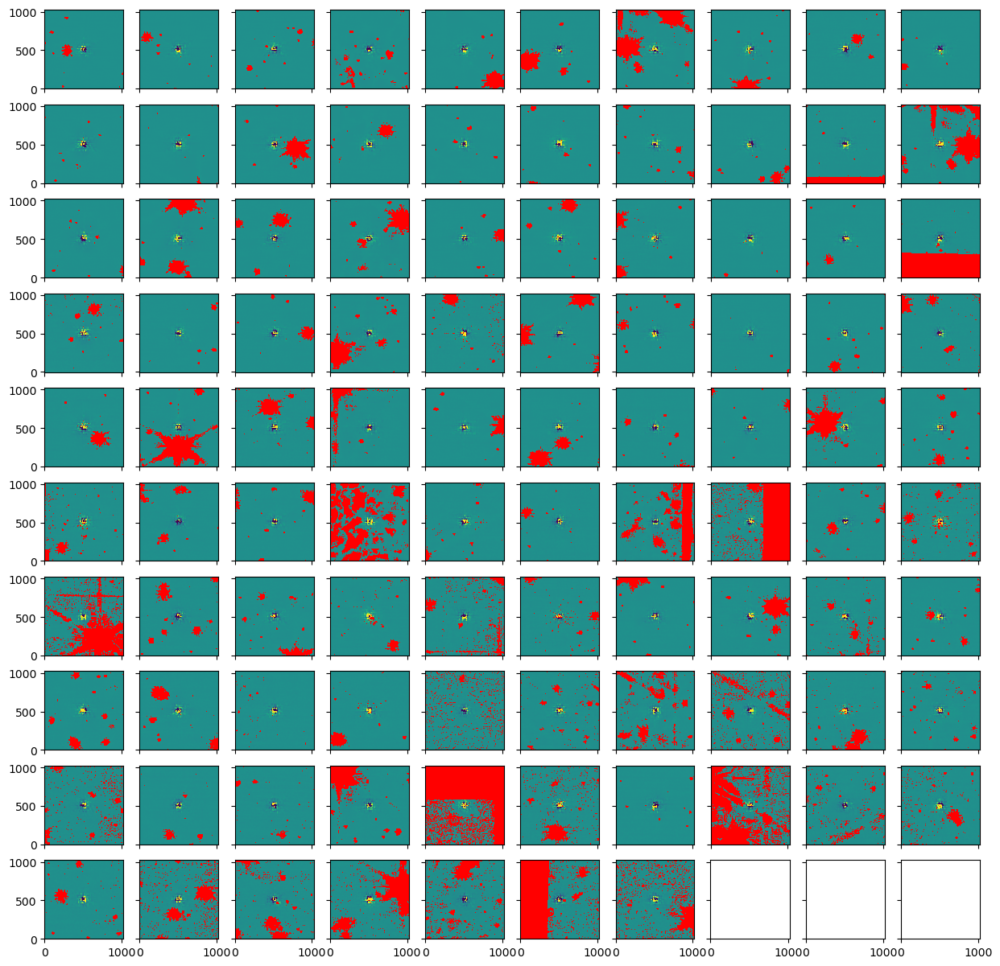

In [882]:
fig, axes = plt.subplots(10, 10, sharex=True, sharey=True, figsize=(15, 15))
for ax, im in zip(axes.flat, ocutouts_norm):
    fac = np.nansum(im) / np.sum(omean2)
    ax.imshow(im - fac * omean2, vmin=-0.003, vmax=0.003, cmap=cmap)

### Repeat for the saturated stars

Use a bigger cutout and less oversampling


In [842]:
scutouts = np.stack(
    list(
        oversampled_centered_cutout(im_sub, wcs_pix, x0, y0, size=256, oversample=4)[0] 
        for (x0, y0) in xy_unsaturated
    )
)

For the saturated stars, we normalize by sums, although nothing is really ideal in this case if we are missing significant flux to the saturated pixels

In [921]:
scutouts_norm = scutouts / np.nanmax(ocutouts, axis=(1, 2), keepdims=True)

In [922]:
scutouts_norm = sigma_clip(scutouts_norm, sigma=3.0, axis=0)

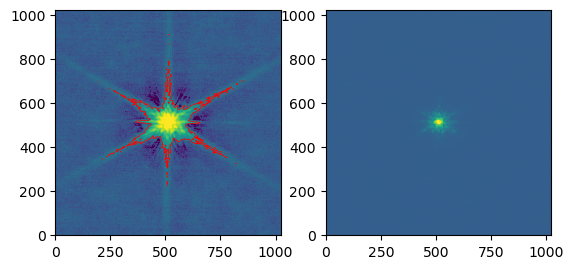

In [936]:
fig, ax = plt.subplots(1, 2)
smean = np.nanmean(scutouts_norm, axis=0)
sstd = np.nanstd(scutouts_norm, axis=0) / np.sqrt(len(xy_unsaturated))
s_n = smean / sstd
norm = av.simple_norm(smean, percent=99.5, stretch='log')
ax[0].imshow(smean, norm=norm)
ax[1].imshow(sstd, norm=norm)
ax[0].contour(s_n, levels=[10], colors='r', linewidths=0.5)

Compare the saturated and unsaturated profiles, also with the oversampled models and the central star observations

In [955]:
modpsf = psf2["OVERDIST"].data

/var/folders/sv/41w0vxds13d20rvl07t_1x2w0000gn/T/ipykernel_93416/263119965.py:6: RuntimeWarning: Mean of empty slice
  obs_prof = np.nanmean(imobs[:, ipix//2 - width//8:ipix//2 + width//8], axis=1)


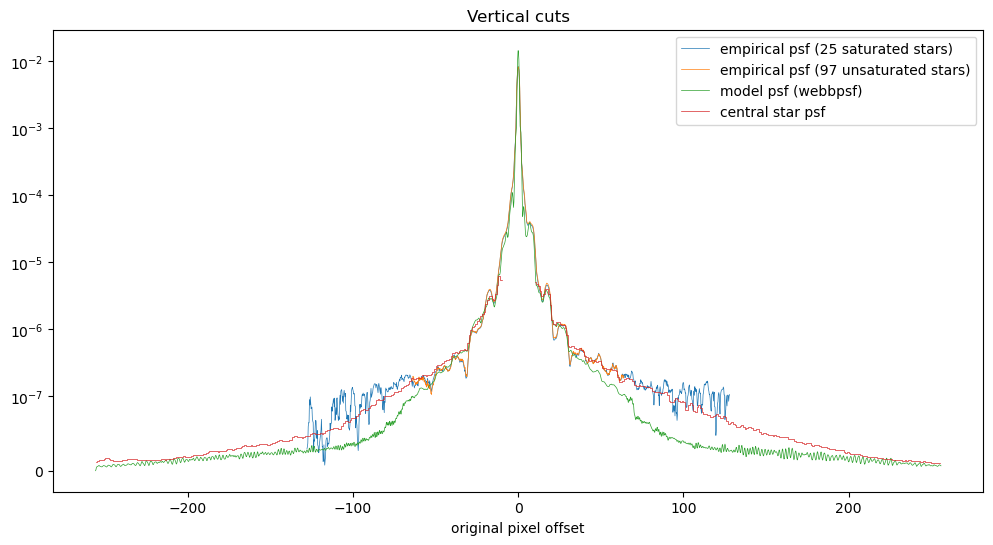

In [970]:
fig, ax = plt.subplots(figsize=(12, 6))
ipix, width = 512, 8
sat_prof = np.nanmean(smean[:, ipix - width//2:ipix + width//2], axis=1) / smean.sum()
unsat_prof = np.nanmean(omean2[:, ipix - width:ipix + width], axis=1) / smean.sum()
mprof = np.nanmean(modpsf[:, 2 * ipix - width//2:2 * ipix + width//2], axis=1)
obs_prof = np.nanmean(imobs[:, ipix//2 - width//8:ipix//2 + width//8], axis=1)
ax.plot((np.arange(1024) - 511.5)/4, sat_prof, linewidth=0.5, 
        label=f"empirical psf ({len(xy_saturated)} saturated stars)")
ax.plot((np.arange(1024) - 511.5)/8, unsat_prof, linewidth=0.5, 
        label=f"empirical psf ({len(xy_unsaturated)} unsaturated stars)")
ax.plot((np.arange(2048) - 1023.5)/4, mprof, linewidth=0.5, label="model psf (webbpsf)")
ax.plot(
    (np.arange(512) - 255.5), 
    obs_prof * 2.5e-9, 
    drawstyle="steps-mid",
    linewidth=0.5, 
    label="central star psf",
)
ax.set_yscale("symlog", linthresh=1e-7, linscale=1)
ax.set(xlabel="original pixel offset")
ax.set_title("Vertical cuts")
ax.legend()
...;

So they show very good agreement between saturated/unsaturated out to the full extent of the unsaturated cutouts. This suggests that I could have extended these further. 

The agreement with the model PSF is less good. The model shows oscillations at the right positions but the exact shape is a bit off. However, some of the deeper dips in the empirical psf may be the negative halo that is seen (probably due to deficiencies in subtracting the background).

The central star psf does not show these dips, agreeing better with the model for offsets around 25. However for offsets > 50 it follows the empirical psfs much better than the model one. Even though the empirical ones are noisy for offsets > 100

/var/folders/sv/41w0vxds13d20rvl07t_1x2w0000gn/T/ipykernel_93416/3874625479.py:6: RuntimeWarning: Mean of empty slice
  obs_prof = np.nanmean(imobs[ipix//2 - width//8:ipix//2 + width//8, :], axis=0)


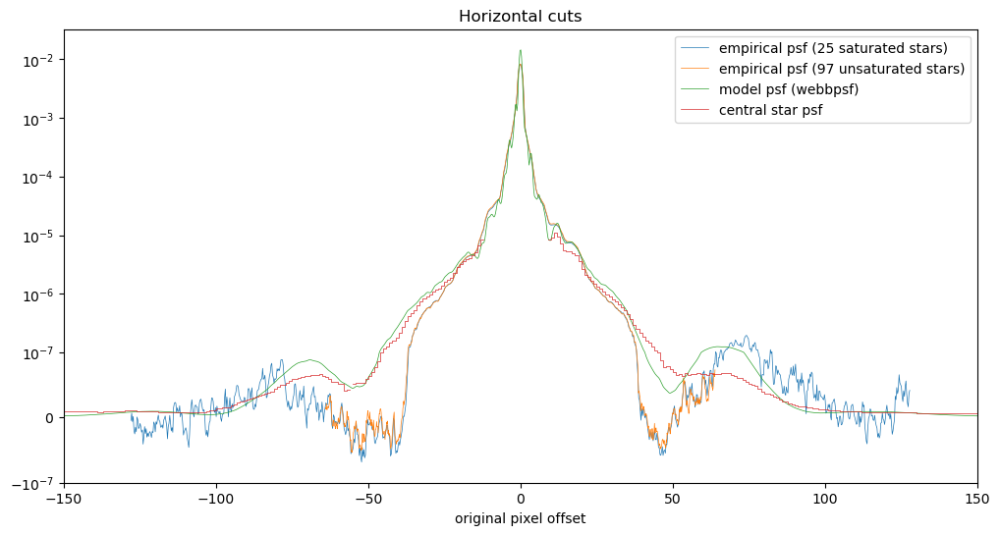

In [971]:
fig, ax = plt.subplots(figsize=(12, 6))
ipix, width = 512, 8
sat_prof = np.nanmean(smean[ipix - width//2:ipix + width//2, :], axis=0) / smean.sum()
unsat_prof = np.nanmean(omean2[ipix - width:ipix + width, :], axis=0) / smean.sum()
mprof = np.nanmean(modpsf[2 * ipix - width//2:2 * ipix + width//2, :], axis=0)
obs_prof = np.nanmean(imobs[ipix//2 - width//8:ipix//2 + width//8, :], axis=0)
ax.plot((np.arange(1024) - 511.5)/4, sat_prof, linewidth=0.5, 
        label=f"empirical psf ({len(xy_saturated)} saturated stars)")
ax.plot((np.arange(1024) - 511.5)/8, unsat_prof, linewidth=0.5, 
        label=f"empirical psf ({len(xy_unsaturated)} unsaturated stars)")
ax.plot((np.arange(2048) - 1023.5)/4, mprof, linewidth=0.5, label="model psf (webbpsf)")
ax.plot(
    (np.arange(512) - 255.5), 
    obs_prof * 2.5e-9, 
    drawstyle="steps-mid",
    linewidth=0.5, 
    label="central star psf",
)
ax.set_yscale("symlog", linthresh=1e-7, linscale=1)
ax.set(xlabel="original pixel offset", xlim=[-150, 150])
ax.set_title("Horizontal cuts")
ax.legend()
...;

The horizontal cuts show even more clearly the problem with the negative halo in the empirical psfs

## Finally try and subtract the psf on the original pixel grid

The moment of truth, where we find out how well this has worked.

### Function to project fine $\to$ coarse

We want to do the inverse of `oversampled_centered_cutout()` where we reproject the mean oversampled psf back to a cutout of the big image at the original pixel scale. 

In [1108]:
def coarse_cutout_from_oversampled_psf(psfim, im, wcsi, xcenter, ycenter, oversample=8, order="bilinear"):
    """Reproject `psfim` back to coarse image `im`, centered on `xcenter`, `ycenter`
    
    Also requires coarse-pixel WCS `wcsi` for original image and `oversample` factoeior.
    Returns cutout that encloses `psfim` on the original image."""

    # Set up the output oversampled cutout wcs
    wcso = WCS()
    wcso.pixel_shape = psfim.shape
    assert wcso.pixel_shape[0] == wcso.pixel_shape[1], "psfim must be square"
    assert wcso.pixel_shape[0] % oversample == 0, "psfim size must be integer multiple of oversample factor"
    size = wcso.pixel_shape[0] // oversample
    wcso.wcs.cdelt = [1 / oversample, 1 / oversample]
    wcso.wcs.crpix = (np.array(wcso.pixel_shape) + 1) / 2
    wcso.wcs.crval = xcenter, ycenter
    wcso.wcs.cunit = ["pixel", "pixel"]
    wcso.wcs.cname = ["x", "y"]
    wcso.wcs.ctype = ["pos.cartesian.x", "pos.cartesian.y"]

    # Get cutout of original pixel grid
    cutout = Cutout2D(
        im, 
        (xcenter, ycenter), 
        size=size, wcs=wcsi, copy=True, mode="partial",
    )    

    # Reproject PSF from oversampled grid back to cutout
    cutout.psfdata = reproject_interp(
        (psfim, wcso), 
        cutout.wcs, 
        (size, size), 
        order=order,
        return_footprint=False,
    )

    # return the cutout with psf attached
    return cutout

Test it. Find a star that is close to the center

In [1101]:
xx, yy = (np.array(xy_unsaturated) - np.array([2316.35, 2323.38])).T
iclosest = np.argmin(np.hypot(xx, yy))
iclosest, xy_unsaturated[iclosest]

(53, (2002.9174799421794, 1955.4563822422374))

So 53 is the closest, and we get similar results for 25 

In [1282]:
x0, y0 = xy_unsaturated[53]
#x0, y0  = 2316.35, 2323.38

dx, dy = -0.00, -0.02 # for 53
# dx, dy = 0.00, 0.03 # for 25
cutout = coarse_cutout_from_oversampled_psf(omean2, im_sub, wcs_pix, x0 + dx, y0 + dy, oversample=8)

In [1283]:
cutout.wcs

WCS Keywords

Number of WCS axes: 2
CTYPE : 'pos.cartesian.x' 'pos.cartesian.y' 
CRVAL : 0.0 0.0 
CRPIX : -1938.0 -1891.0 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 1.0 1.0 
NAXIS : 128  128

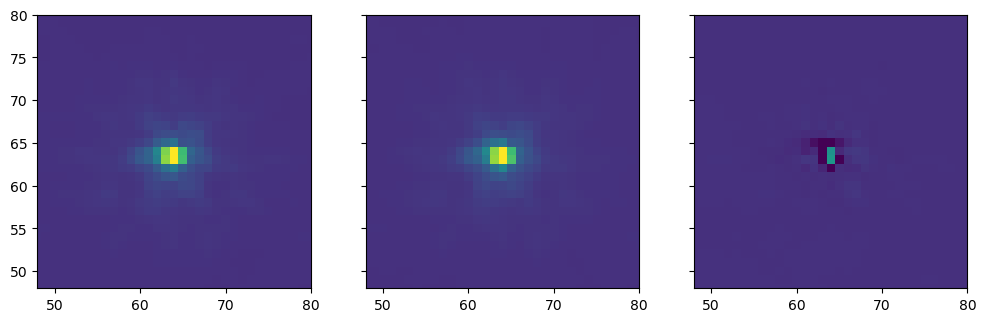

In [1293]:
fig, ax = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(12, 4))
norm = av.simple_norm(cutout.sdata, min_cut=-20, max_cut=1000, stretch='sqrt')
fac = 0.85 * np.nanmax(cutout.data) / np.nanmax(cutout.psfdata)
ax[0].imshow(cutout.data, norm=norm)
ax[1].imshow(fac * cutout.psfdata, norm=norm)
ax[2].imshow(cutout.data - fac * cutout.psfdata, norm=norm)
ax[0].set(xlim=[48, 80], ylim=[48, 80])
...;

So this has a systematic problem that the empirical psf is slightly too broad, so it undersubtracts in the center and over-subtracts in a ring. 

Use 1d profile to investigate further

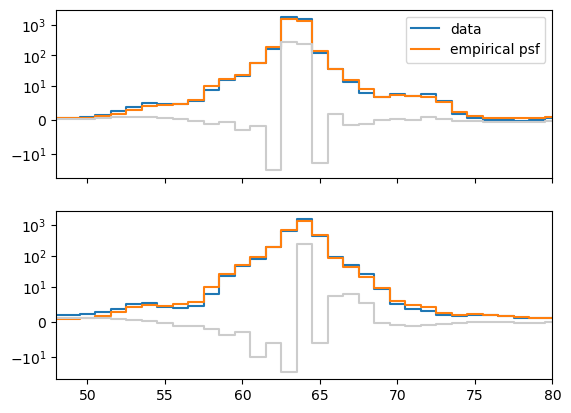

In [1285]:
fig, (ax, axx) = plt.subplots(2, 1, sharex=True)

ax.plot(cutout.data[:, 64], drawstyle="steps-mid", label="data")
ax.plot(fac * cutout.psfdata[:, 64], drawstyle="steps-mid", label='empirical psf')
ax.legend()
ax.set(xlim=[48, 80])
ax.set_yscale("symlog", linthresh=10, linscale=1)
ax.plot(cutout.data[:, 64] - fac * cutout.psfdata[:, 64], drawstyle="steps-mid", color="0.8", label="difference")

axx.plot(cutout.data[64, :], drawstyle="steps-mid", label="data")
axx.plot(fac * cutout.psfdata[64, :], drawstyle="steps-mid", label='empirical psf')
axx.set(xlim=[48, 80])
axx.set_yscale("symlog", linthresh=10, linscale=1)
axx.plot(cutout.data[64, :]- fac * cutout.psfdata[64, :], drawstyle="steps-mid", color="0.8", label="difference")


...;

Give just a tad more smoothing to the data, to match the psf better

In [1306]:
esigx, esigy = 0.29, 0.29
kernel = Gaussian2DKernel(x_stddev=esigx, y_stddev=esigy, x_size=3, y_size=3, mode='integrate')

In [1307]:
kernel.array

array([[0.00179279, 0.03875578, 0.00179279],
       [0.03875578, 0.8378057 , 0.03875578],
       [0.00179279, 0.03875578, 0.00179279]])

In [1308]:
cutout.sdata = convolve(cutout.data, kernel)

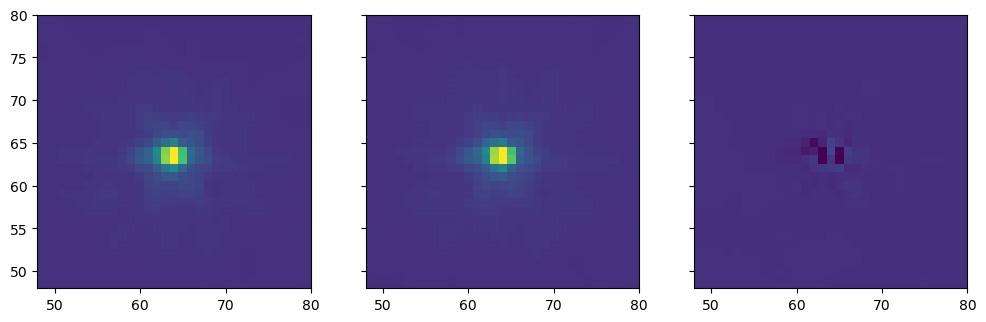

In [1309]:
fig, ax = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(12, 4))
norm = av.simple_norm(cutout.sdata, min_cut=-20, max_cut=1000, stretch='sqrt')
fac = 0.9 * np.nanmax(cutout.data) / np.nanmax(cutout.psfdata)
ax[0].imshow(cutout.sdata, norm=norm)
ax[1].imshow(fac * cutout.psfdata, norm=norm)
ax[2].imshow(cutout.sdata - fac * cutout.psfdata, norm=norm)
ax[0].set(xlim=[48, 80], ylim=[48, 80])
...;

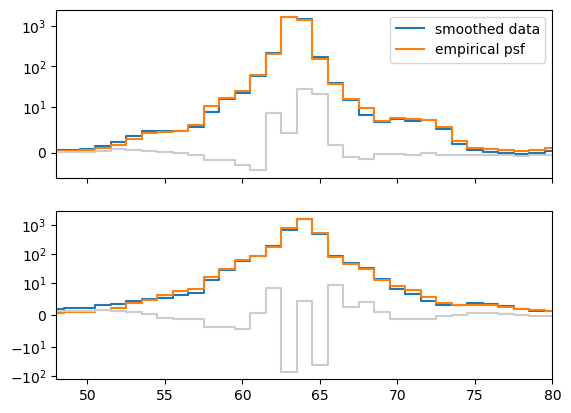

In [1310]:
fig, (ax, axx) = plt.subplots(2, 1, sharex=True)


ax.plot(cutout.sdata[:, 64], drawstyle="steps-mid", label="smoothed data")
ax.plot(fac * cutout.psfdata[:, 64], drawstyle="steps-mid", label='empirical psf')
ax.legend()
ax.set(xlim=[48, 80])
ax.set_yscale("symlog", linthresh=10, linscale=1)
ax.plot(cutout.sdata[:, 64] - fac * cutout.psfdata[:, 64], drawstyle="steps-mid", color="0.8", label="difference")

axx.plot(cutout.sdata[63, :], drawstyle="steps-mid", label="smoothed data")
axx.plot(fac * cutout.psfdata[63, :], drawstyle="steps-mid", label='empirical psf')
axx.set(xlim=[48, 80])
axx.set_yscale("symlog", linthresh=10, linscale=1)
axx.plot(cutout.sdata[63, :] - fac * cutout.psfdata[63, :], drawstyle="steps-mid", color="0.8", label="difference")

So maybe we can get te residuals down to 1% with a combination of sub-pixel shifts and convolution

## Set up a fitting framework

So there are a few different ways I see to do this

1. We could just use lmfit, so we get full control over the objective function and we can get estimates of the uncertainties and correlations between parameters. Either just from the hessian or from mcmc
2. We could try and get our head around how astropy.fitting works. 
3. We could look into using photutils to make a fittable model out of an image. 

To be honest, I think #1 looks like the best bet - better the devil you know!